### Verificamos la versión de CUDA y CUDNN

In [1]:
import torch

print("Versión de PyTorch:", torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
print("Versión de CUDA (compilador):", torch.version.cuda)
print("cuDNN disponible:", torch.backends.cudnn.is_available())
print("Versión de cuDNN:", torch.backends.cudnn.version())

Versión de PyTorch: 2.5.0+cu124
CUDA disponible: True
Versión de CUDA (compilador): 12.4
cuDNN disponible: True
Versión de cuDNN: 90100


### Identificamos las clases del dataset

In [2]:
import os

# Ruta donde están las imágenes organizadas en carpetas por clase
dataset_path = 'dataset_papa'

# Listar las carpetas (clases)
clases = [folder for folder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, folder))]

print("Clases encontradas:")
for clase in clases:
    print(clase)

Clases encontradas:
.git
Agusanada
Otros
Podredumbre seca
Sano
Sarna comun
Sarna negra
Sarna polvorienta
Verruga


### Particionamos los datos para el train (60%), val (20%) y test (20%)

In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

original_dir = 'dataset_papa'
base_output_dir = 'prepared_dataset_papa'
splits = ['train', 'val', 'test']

# Carpetas que quieres excluir
excluded_folders = ['.git', 'Otros', 'Verruga', 'Sarna polvorienta']

# Limpiar las carpetas de salida si ya existen
for split in splits:
    split_path = os.path.join(base_output_dir, split)
    if os.path.exists(split_path):
        shutil.rmtree(split_path)

# Obtener las clases válidas (excluyendo las no deseadas)
classes = [
    folder for folder in os.listdir(original_dir)
    if os.path.isdir(os.path.join(original_dir, folder)) and folder not in excluded_folders
]

# Procesar cada clase
for cls in classes:
    img_dir = os.path.join(original_dir, cls)
    images = [img for img in os.listdir(img_dir) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if len(images) < 3:
        print(f"Clase '{cls}' tiene muy pocas imágenes ({len(images)}), se usará solo para entrenamiento.")
        train_imgs = images
        val_imgs = []
        test_imgs = []
    else:
        # 60% train, 40% restante
        train_imgs, temp_imgs = train_test_split(images, test_size=0.4, random_state=42)
        # De ese 40%, 50% val (20% total), 50% test (20% total)
        val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=42)

    for split_name, split_imgs in zip(splits, [train_imgs, val_imgs, test_imgs]):
        split_dir = os.path.join(base_output_dir, split_name, cls)
        os.makedirs(split_dir, exist_ok=True)
        for img in split_imgs:
            src = os.path.join(img_dir, img)
            dst = os.path.join(split_dir, img)
            shutil.copy(src, dst)

### Verificamos la repartición de datos

In [3]:
import os
from collections import Counter

# Directorios
base_dir = 'prepared_dataset_papa'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

def count_images_per_class(directory):
    print(f'\nRevisando: {directory}')
    total_images = 0
    class_counts = {}
    
    if not os.path.exists(directory):
        print(f'❌ El directorio {directory} no existe.')
        return
    
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            count = len([
                fname for fname in os.listdir(class_path)
                if fname.lower().endswith(('.jpg', '.jpeg', '.png'))
            ])
            class_counts[class_name] = count
            total_images += count

    for class_name, count in class_counts.items():
        print(f'Clase "{class_name}": {count} imágenes')

    print(f'Total en "{directory}": {total_images} imágenes')

# Ejecutar para cada conjunto
count_images_per_class(train_dir)
count_images_per_class(val_dir)
count_images_per_class(test_dir)


Revisando: prepared_dataset_papa\train
Clase "Agusanada": 78 imágenes
Clase "Podredumbre seca": 73 imágenes
Clase "Sano": 83 imágenes
Clase "Sarna comun": 73 imágenes
Clase "Sarna negra": 70 imágenes
Total en "prepared_dataset_papa\train": 377 imágenes

Revisando: prepared_dataset_papa\val
Clase "Agusanada": 26 imágenes
Clase "Podredumbre seca": 24 imágenes
Clase "Sano": 28 imágenes
Clase "Sarna comun": 25 imágenes
Clase "Sarna negra": 24 imágenes
Total en "prepared_dataset_papa\val": 127 imágenes

Revisando: prepared_dataset_papa\test
Clase "Agusanada": 27 imágenes
Clase "Podredumbre seca": 25 imágenes
Clase "Sano": 28 imágenes
Clase "Sarna comun": 25 imágenes
Clase "Sarna negra": 24 imágenes
Total en "prepared_dataset_papa\test": 129 imágenes


### Graficamos los datos

In [4]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def mostrar_imagenes_aleatorias(base_dir, subsets=('train', 'val', 'test'), num_imagenes=10):
    for subset in subsets:
        subset_path = os.path.join(base_dir, subset)
        print(f'\nMostrando {num_imagenes} imágenes aleatorias del conjunto: {subset.upper()}')

        # Recolectar todas las rutas de imágenes
        imagenes = []
        for clase in os.listdir(subset_path):
            clase_path = os.path.join(subset_path, clase)
            if os.path.isdir(clase_path):
                imagenes_clase = [os.path.join(clase_path, img)
                                  for img in os.listdir(clase_path)
                                  if img.lower().endswith(('.jpg', '.jpeg', '.png'))]
                imagenes.extend(imagenes_clase)

        # Seleccionar imágenes aleatorias
        muestras = random.sample(imagenes, min(num_imagenes, len(imagenes)))

        # Mostrar imágenes
        fig, axs = plt.subplots(1, len(muestras), figsize=(15, 5))
        for i, img_path in enumerate(muestras):
            img = mpimg.imread(img_path)
            axs[i].imshow(img)
            axs[i].axis('off')
            axs[i].set_title(os.path.basename(os.path.dirname(img_path)))  # nombre de clase
        plt.tight_layout()
        plt.show()


Mostrando 10 imágenes aleatorias del conjunto: TRAIN


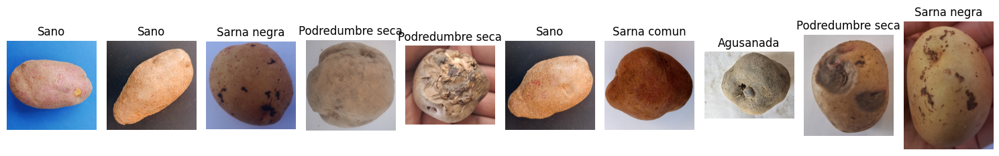


Mostrando 10 imágenes aleatorias del conjunto: VAL


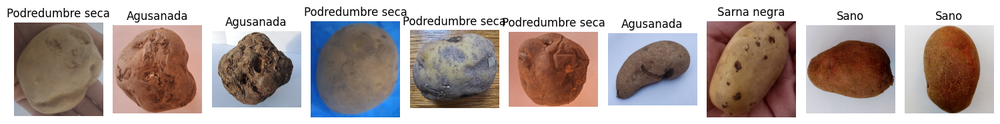


Mostrando 10 imágenes aleatorias del conjunto: TEST


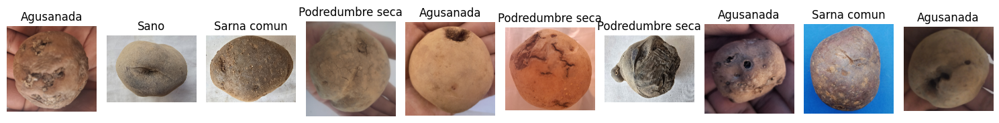

In [5]:
mostrar_imagenes_aleatorias('prepared_dataset_papa')

### Configuraciones necesarias para el entrenamiento

#### Importamos las librerias necesarias

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from tqdm import tqdm
from sklearn.metrics import classification_report
import time
import pandas as pd

#### Configuración general

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dir = "prepared_dataset_papa/train"
val_dir = "prepared_dataset_papa/val"
test_dir = "prepared_dataset_papa/test"

img_size = 224
num_classes = 5

#### Transformaciones

In [3]:
def get_transforms(img_size):
    train_transforms = transforms.Compose([
        transforms.RandomResizedCrop(img_size, scale=(0.8, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.35, contrast=0.3, saturation=0.3, hue=0.05),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])
    ])
    val_test_transforms = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])
    ])
    
    return train_transforms, val_test_transforms

### Función genérica para cargar modelos preentrenados en PyTorch

In [4]:
def load_pretrained_model(model_name: str, num_classes: int):
    model_name = model_name.lower()

    if model_name == "resnet18":
        model = models.resnet18(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "resnet34":
        model = models.resnet34(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "resnet50":
        model = models.resnet50(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "resnet101":
        model = models.resnet101(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "alexnet":
        model = models.alexnet(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    elif model_name == "vgg16":
        model = models.vgg16(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    elif model_name == "vgg19":
        model = models.vgg19(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    elif model_name == "mobilenet_v2":
        model = models.mobilenet_v2(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_name == "efficientnet_b0":
        model = models.efficientnet_b0(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_name == "efficientnet_b4":
        model = models.efficientnet_b4(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_name == "densenet121":
        model = models.densenet121(pretrained=True)
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    elif model_name == "googlenet":
        model = models.googlenet(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "inception_v3":
        model = models.inception_v3(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    else:
        raise ValueError(f"Modelo '{model_name}' no soportado")
    return model

### Early Stopping Helper

In [5]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_score = None
        self.counter = 0

    def step(self, val_loss):
        if self.best_score is None or val_loss < self.best_score - self.min_delta:
            self.best_score = val_loss
            self.counter = 0
            return False  # no stop
        self.counter += 1
        return self.counter >= self.patience

### Función de inicialización de entrenamiento

In [6]:
def prepare_training(model, lr=0.001, device='cuda', scheduler_type=None):
    from torchinfo import summary
    model = model.to(device)
    summary(model, input_size=(1, 3, 224, 224))
    
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
    scheduler = None
    if scheduler_type == "reduce_on_plateau":
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)
    elif scheduler_type == "step":
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

    criterion = nn.CrossEntropyLoss()
    
    return model, criterion, optimizer, scheduler

### Función para el entrenamiento

In [8]:
import torch
import os
from tqdm import tqdm
import copy
from datetime import datetime
import time

def train_model(model, train_loader, val_loader, criterion, optimizer, epochs, device, model_name="model", use_early_stopping=False, scheduler=None, clip_grad_norm=None):
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_dir = f"runs/{model_name}_{timestamp}"
    os.makedirs(base_dir, exist_ok=True)

    save_path = os.path.join(base_dir, "best_model.pth")

    history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': []
    }

    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    
    early_stopper = EarlyStopping(patience=5) if use_early_stopping else None

    for epoch in range(epochs):
        epoch_start_time = time.time()  # ⏱️ Inicio del tiempo

        model.train()
        running_loss = 0
        correct = 0
        total = 0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)

        for images, labels in loop:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            
            if model_name == "inception_v3" and model.training:
                outputs, aux_outputs = model(images)
                loss = criterion(outputs, labels) + 0.4 * criterion(aux_outputs, labels)
            else:
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            loss.backward()
            
            if clip_grad_norm:
                torch.nn.utils.clip_grad_norm_(model.parameters(), clip_grad_norm)
            
            optimizer.step()

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
            total += labels.size(0)

            loop.set_postfix(loss=running_loss / len(train_loader), acc=100. * correct / total)

        train_loss = running_loss / len(train_loader)
        train_acc = 100. * correct / total

        # Validación
        model.eval()
        val_correct = 0
        val_total = 0
        val_loss = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_correct += predicted.eq(labels).sum().item()
                val_total += labels.size(0)

        val_acc = 100. * val_correct / val_total
        val_loss_avg = val_loss / len(val_loader)

        # Scheduler
        if scheduler:
            scheduler.step(val_loss_avg)

        # Early stopping
        if use_early_stopping and early_stopper.step(val_loss_avg):
            tqdm.write(f"⏹️ Early stopping activado en epoch {epoch+1}")
            break

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss_avg)
        history['val_acc'].append(val_acc)

        # ⏱️ Tiempo de época
        epoch_duration = time.time() - epoch_start_time

        # 📊 Resumen de la época
        tqdm.write(
            f"📊 Epoch {epoch+1}/{epochs} | "
            f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}% | "
            f"Val Loss: {val_loss_avg:.4f} | Val Acc: {val_acc:.2f}% | "
            f"⏱️ {epoch_duration:.2f}s"
        )

        # Guardar mejor modelo
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            torch.save(best_model_wts, save_path)
            tqdm.write(f"✅ Mejor modelo guardado: {save_path} (Val Acc: {val_acc:.2f}%)")

    model.load_state_dict(best_model_wts)

    # Guardar historial
    history_path = os.path.join(base_dir, "training_history.pth")
    torch.save(history, history_path)
    tqdm.write(f"📁 Historial guardado en {history_path}")

    return model, history, base_dir

### Función para evaluar el modelo

In [9]:
def evaluate_model(model, data_loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
            total += labels.size(0)
    accuracy = 100. * correct / total
    return accuracy

### Función para graficar pérdidas y precisiones

In [10]:
import matplotlib.pyplot as plt

def plot_training_history(history, save_dir=None):
    plt.figure(figsize=(12, 5))

    # Pérdida
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Precisión
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy')
    plt.plot(history['val_acc'], label='Val Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        path = os.path.join(save_dir, 'training_history.png')
        plt.savefig(path)
        print(f"📁 Gráfico de historial guardado en: {path}")
    plt.show()

### Función para matriz de confusión en test

In [11]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(model, test_loader, device, class_names, save_dir=None):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
    plt.title("Matriz de Confusión - Test Set")
    plt.grid(False)
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        path = os.path.join(save_dir, 'confusion_matrix.png')
        plt.savefig(path)
        print(f"📁 Matriz de confusión guardada en: {path}")
    plt.show()

### Curva ROC y AUC por clase

In [12]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
import os

def plot_roc_auc_curve(model, data_loader, device, class_names, save_dir=None):
    model.eval()
    y_true = []
    y_score = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            y_true.extend(labels.cpu().numpy())
            y_score.extend(probs.cpu().numpy())

    y_true = np.array(y_true)
    y_score = np.array(y_score)
    y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    plt.figure(figsize=(10, 8))

    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], label=f"{class_names[i]} (AUC = {roc_auc[i]:.2f})")

    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.title("Curvas ROC por Clase")
    plt.xlabel("Tasa de Falsos Positivos")
    plt.ylabel("Tasa de Verdaderos Positivos")
    plt.legend(loc="lower right")
    plt.grid(True)

    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        path = os.path.join(save_dir, 'roc_auc_curve.png')
        plt.savefig(path)
        print(f"📁 Curva ROC guardada en: {path}")

    plt.show()

### Visualizar errores de predicción

In [13]:
import matplotlib.pyplot as plt
import numpy as np

def show_misclassified_images(model, data_loader, class_names, device, max_images=12, save_dir=None):
    model.eval()
    images_list = []
    true_labels = []
    pred_labels = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = outputs.max(1)

            for img, true, pred in zip(images.cpu(), labels, preds.cpu()):
                if true != pred:
                    images_list.append(img)
                    true_labels.append(true.item())
                    pred_labels.append(pred.item())
                if len(images_list) >= max_images:
                    break
            if len(images_list) >= max_images:
                break

    if not images_list:
        print("✅ No se encontraron errores de clasificación.")
        return

    n_cols = 4
    n_rows = (max_images + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
    axes = axes.flatten()

    for i in range(len(images_list)):
        img = images_list[i].permute(1, 2, 0).numpy()
        img = img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Desnormaliza
        img = np.clip(img, 0, 1)
        axes[i].imshow(img)
        axes[i].set_title(f"T: {class_names[true_labels[i]]}\nP: {class_names[pred_labels[i]]}", fontsize=10)
        axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    if save_dir:
        path = os.path.join(save_dir, 'misclassified_examples.png')
        plt.savefig(path)
        print(f"📁 Ejemplos mal clasificados guardados en: {path}")
    plt.show()

### Función para actualizar resultados csv

In [14]:
import os
import pandas as pd

def save_results_to_csv(df_results, csv_path="results_summary.csv"):
    """
    Guarda los resultados en un archivo CSV. Si el archivo ya existe, los nuevos resultados se anexan.
    
    Args:
        df_results (pd.DataFrame): DataFrame con los resultados actuales.
        csv_path (str): Ruta del archivo CSV donde se guardarán los resultados.
    """
    if os.path.exists(csv_path):
        try:
            existing_df = pd.read_csv(csv_path)
            df_results = pd.concat([existing_df, df_results], ignore_index=True)
        except Exception as e:
            print(f"⚠️ Error al leer CSV existente: {e}")
            print("➡️ Se sobrescribirá el archivo.")
    
    df_results.to_csv(csv_path, index=False)
    print(f"\n✅ Resultados guardados/actualizados en {csv_path}")


### Precision

In [15]:
import torch
import os
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, classification_report

def evaluate_precision(model, data_loader, device, class_names, savedir=None):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = outputs.max(1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    # Obtener el reporte de clasificación como diccionario
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4, output_dict=True)

    # Extraer precisión por clase
    precisions = [report[class_name]["precision"] for class_name in class_names]

    # Graficar las precisiones
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, precisions, color='skyblue')
    plt.ylim(0, 1)
    plt.ylabel("Precision")
    plt.title("Precision por Clase")

    # Agregar valores encima de las barras
    for bar, precision in zip(bars, precisions):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{precision:.2f}", ha='center', va='bottom')

    # Guardar o mostrar la gráfica
    if savedir:
        os.makedirs(savedir, exist_ok=True)
        save_path = os.path.join(savedir, "precision_por_clase.png")
        plt.savefig(save_path, bbox_inches='tight')
        print(f"📁 Gráfico guardado en: {save_path}")
    else:
        plt.show()

    # Imprimir macro y weighted precision
    macro_precision = precision_score(y_true, y_pred, average='macro')
    weighted_precision = precision_score(y_true, y_pred, average='weighted')
    print(f"\n📊 Macro Precision:    {macro_precision:.4f}")
    print(f"📊 Weighted Precision: {weighted_precision:.4f}")

### Recall

In [16]:
import torch
import os
import matplotlib.pyplot as plt
from sklearn.metrics import recall_score, classification_report

def evaluate_recall(model, data_loader, device, class_names, savedir=None):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = outputs.max(1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    # Reporte de clasificación con recall por clase
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4, output_dict=True)

    # Extraer recall por clase
    recalls = [report[class_name]["recall"] for class_name in class_names]

    # Graficar recall por clase
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, recalls, color='lightcoral')
    plt.ylim(0, 1)
    plt.ylabel("Recall")
    plt.title("Recall por Clase")

    # Valores encima de barras
    for bar, recall in zip(bars, recalls):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{recall:.2f}", ha='center', va='bottom')

    # Guardar o mostrar gráfica
    if savedir:
        os.makedirs(savedir, exist_ok=True)
        save_path = os.path.join(savedir, "recall_por_clase.png")
        plt.savefig(save_path, bbox_inches='tight')
        print(f"📁 Gráfico guardado en: {save_path}")
    else:
        plt.show()

    # Imprimir recall macro y weighted
    macro_recall = recall_score(y_true, y_pred, average='macro')
    weighted_recall = recall_score(y_true, y_pred, average='weighted')
    print(f"\n📊 Macro Recall:    {macro_recall:.4f}")
    print(f"📊 Weighted Recall: {weighted_recall:.4f}")

### F1-Score

In [17]:
import torch
import os
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, classification_report

def evaluate_f1_score(model, data_loader, device, class_names, savedir=None):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = outputs.max(1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    # Reporte con f1-score por clase
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4, output_dict=True)

    # Extraer f1-score por clase
    f1_scores = [report[class_name]["f1-score"] for class_name in class_names]

    # Graficar f1-score por clase
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, f1_scores, color='mediumseagreen')
    plt.ylim(0, 1)
    plt.ylabel("F1-Score")
    plt.title("F1-Score por Clase")

    # Valores encima de las barras
    for bar, f1 in zip(bars, f1_scores):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{f1:.2f}", ha='center', va='bottom')

    # Guardar o mostrar gráfica
    if savedir:
        os.makedirs(savedir, exist_ok=True)
        save_path = os.path.join(savedir, "f1_score_por_clase.png")
        plt.savefig(save_path, bbox_inches='tight')
        print(f"📁 Gráfico guardado en: {save_path}")
    else:
        plt.show()

    # Imprimir macro y weighted f1-score
    macro_f1 = f1_score(y_true, y_pred, average='macro')
    weighted_f1 = f1_score(y_true, y_pred, average='weighted')
    print(f"\n📊 Macro F1-Score:    {macro_f1:.4f}")
    print(f"📊 Weighted F1-Score: {weighted_f1:.4f}")

### Función para probar múltiples modelos y parámetros

In [18]:
from torchvision import datasets

def train_multiple_models(models_params, train_dir, val_dir, test_dir, num_classes, device):
    results = []
    
    for params in models_params:
        model_name = params.get('model_name')
        img_size = params.get('img_size', 224)
        epochs = params.get('epochs', 20)
        batch_size = params.get('batch_size', 16)
        lr = params.get('learning_rate', 0.001)
        
        #===================================
        use_early_stopping = params.get("early_stopping", False)
        scheduler_type = params.get("scheduler_type", None)
        clip_grad_norm = params.get("clip_grad_norm", None)  # None o float
        #kfold_splits = params.get('kfold_splits', None)        #Pendiente de consulta al ingeniero
        
        print(f"\n🔧 Entrenando {model_name} | Epochs={epochs}, Batch={batch_size}, LR={lr}")
        
        #Transformar las imagenes
        train_transforms, val_test_transforms = get_transforms(img_size)

        # Cargar datasets y loaders
        train_dataset = datasets.ImageFolder(train_dir, transform=train_transforms)
        val_dataset = datasets.ImageFolder(val_dir, transform=val_test_transforms)
        test_dataset = datasets.ImageFolder(test_dir, transform=val_test_transforms)

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

        # Modelo y entrenamiento
        model = load_pretrained_model(model_name, num_classes)
        model, criterion, optimizer, scheduler = prepare_training(model, lr=lr, device=device, scheduler_type=scheduler_type)

        start_time = time.time()
        model, history, save_dir = train_model(
            model, train_loader, val_loader, criterion, optimizer, epochs, device, model_name=model_name,
            use_early_stopping=use_early_stopping,
            scheduler=scheduler,
            clip_grad_norm=clip_grad_norm)
        total_time = time.time() - start_time

        # Evaluación en test
        test_acc = evaluate_model(model, test_loader, device)

        # 📊 Graficar historial y matriz de confusión
        plot_training_history(history, save_dir=save_dir)
        plot_confusion_matrix(model, test_loader, device, class_names=train_dataset.classes, save_dir=save_dir)
        plot_roc_auc_curve(model, test_loader, device, class_names=train_dataset.classes, save_dir=save_dir)
        show_misclassified_images(model, test_loader, class_names=train_dataset.classes, device=device, save_dir=save_dir)
        
        # Graficar métricas por clase y guardar imágenes
        evaluate_precision(model, test_loader, device, class_names=train_dataset.classes, savedir=save_dir)
        evaluate_recall(model, test_loader, device, class_names=train_dataset.classes, savedir=save_dir)
        evaluate_f1_score(model, test_loader, device, class_names=train_dataset.classes, savedir=save_dir)

        # 📋 Guardar resultados
        results.append({
            'model_name': model_name,
            'epochs': epochs,
            'batch_size': batch_size,
            'learning_rate': lr,
            'test_accuracy': test_acc,
            'training_time_sec': total_time,
            'save_dir': save_dir,
            'early_stopping': use_early_stopping,
            'scheduler_type': scheduler_type,
            'clip_grad_norm': clip_grad_norm
        })
        
        # Liberar memoria de la GPU y RAM
        del model  # Eliminar el modelo
        del train_loader, val_loader, test_loader  # Eliminar DataLoaders
        del train_dataset, val_dataset, test_dataset  # Eliminar Datasets
        
        # Limpiar la memoria caché de la GPU
        torch.cuda.empty_cache()

    # DataFrame resumen
    df_results = pd.DataFrame(results)

    # Guardar CSV
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    #csv_path = f"results_summary_{timestamp}.csv"
    csv_path = "results_summary_20250716_130955.csv"
    save_results_to_csv(df_results, csv_path)
    print(f"\n✅ Resultados guardados en {csv_path}")

    return df_results

### Uso

In [19]:
print(device)

cuda


### Entrenamos el modelo usando efficientnet_b0


🔧 Entrenando efficientnet_b0 | Epochs=30, Batch=16, LR=0.001


c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📊 Epoch 1/30 | Train Loss: 1.1136 | Train Acc: 53.32% | Val Loss: 0.8589 | Val Acc: 66.93% | ⏱️ 23.25s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 66.93%)


📊 Epoch 2/30 | Train Loss: 0.7383 | Train Acc: 70.29% | Val Loss: 0.8195 | Val Acc: 72.44% | ⏱️ 23.26s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 72.44%)


📊 Epoch 3/30 | Train Loss: 0.5652 | Train Acc: 78.78% | Val Loss: 0.7194 | Val Acc: 74.02% | ⏱️ 23.50s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 74.02%)


📊 Epoch 4/30 | Train Loss: 0.6362 | Train Acc: 76.39% | Val Loss: 0.7612 | Val Acc: 72.44% | ⏱️ 23.48s


📊 Epoch 5/30 | Train Loss: 0.4163 | Train Acc: 85.15% | Val Loss: 0.6318 | Val Acc: 81.89% | ⏱️ 23.17s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 81.89%)


📊 Epoch 6/30 | Train Loss: 0.4927 | Train Acc: 81.70% | Val Loss: 0.9675 | Val Acc: 72.44% | ⏱️ 23.08s


📊 Epoch 7/30 | Train Loss: 0.4420 | Train Acc: 83.82% | Val Loss: 0.9179 | Val Acc: 81.89% | ⏱️ 23.28s


📊 Epoch 8/30 | Train Loss: 0.4096 | Train Acc: 86.47% | Val Loss: 0.5438 | Val Acc: 81.89% | ⏱️ 23.45s


📊 Epoch 9/30 | Train Loss: 0.3092 | Train Acc: 90.19% | Val Loss: 0.4413 | Val Acc: 83.46% | ⏱️ 23.89s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 83.46%)


📊 Epoch 10/30 | Train Loss: 0.2606 | Train Acc: 92.04% | Val Loss: 0.4134 | Val Acc: 85.83% | ⏱️ 23.42s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 85.83%)


📊 Epoch 11/30 | Train Loss: 0.2644 | Train Acc: 88.86% | Val Loss: 0.5525 | Val Acc: 85.04% | ⏱️ 23.18s


📊 Epoch 12/30 | Train Loss: 0.2177 | Train Acc: 92.31% | Val Loss: 0.5977 | Val Acc: 83.46% | ⏱️ 23.21s


📊 Epoch 13/30 | Train Loss: 0.2044 | Train Acc: 93.10% | Val Loss: 0.6909 | Val Acc: 85.04% | ⏱️ 23.68s


📊 Epoch 14/30 | Train Loss: 0.3527 | Train Acc: 89.92% | Val Loss: 1.0320 | Val Acc: 73.23% | ⏱️ 23.33s


📊 Epoch 15/30 | Train Loss: 0.3571 | Train Acc: 88.59% | Val Loss: 0.5817 | Val Acc: 76.38% | ⏱️ 23.02s


📊 Epoch 16/30 | Train Loss: 0.2603 | Train Acc: 90.98% | Val Loss: 0.3785 | Val Acc: 89.76% | ⏱️ 23.43s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 89.76%)


📊 Epoch 17/30 | Train Loss: 0.2900 | Train Acc: 90.19% | Val Loss: 0.4040 | Val Acc: 85.83% | ⏱️ 23.63s


📊 Epoch 18/30 | Train Loss: 0.2535 | Train Acc: 90.45% | Val Loss: 0.4232 | Val Acc: 86.61% | ⏱️ 23.08s


📊 Epoch 19/30 | Train Loss: 0.2536 | Train Acc: 90.98% | Val Loss: 0.5228 | Val Acc: 86.61% | ⏱️ 23.23s


📊 Epoch 20/30 | Train Loss: 0.2690 | Train Acc: 91.78% | Val Loss: 0.5505 | Val Acc: 82.68% | ⏱️ 23.48s


📊 Epoch 21/30 | Train Loss: 0.2569 | Train Acc: 91.25% | Val Loss: 0.5096 | Val Acc: 86.61% | ⏱️ 23.01s


📊 Epoch 22/30 | Train Loss: 0.1357 | Train Acc: 94.96% | Val Loss: 0.6568 | Val Acc: 83.46% | ⏱️ 23.20s


📊 Epoch 23/30 | Train Loss: 0.0849 | Train Acc: 97.35% | Val Loss: 0.4809 | Val Acc: 87.40% | ⏱️ 23.41s


📊 Epoch 24/30 | Train Loss: 0.1284 | Train Acc: 95.76% | Val Loss: 0.3760 | Val Acc: 91.34% | ⏱️ 23.86s
✅ Mejor modelo guardado: runs/efficientnet_b0_20250716_125738\best_model.pth (Val Acc: 91.34%)


📊 Epoch 25/30 | Train Loss: 0.2529 | Train Acc: 92.31% | Val Loss: 0.8881 | Val Acc: 78.74% | ⏱️ 23.66s


📊 Epoch 26/30 | Train Loss: 0.1788 | Train Acc: 93.63% | Val Loss: 0.7127 | Val Acc: 83.46% | ⏱️ 23.15s


📊 Epoch 27/30 | Train Loss: 0.2621 | Train Acc: 92.04% | Val Loss: 0.6224 | Val Acc: 83.46% | ⏱️ 23.67s


📊 Epoch 28/30 | Train Loss: 0.1908 | Train Acc: 93.63% | Val Loss: 0.4903 | Val Acc: 84.25% | ⏱️ 23.15s


📊 Epoch 29/30 | Train Loss: 0.2008 | Train Acc: 93.37% | Val Loss: 0.4194 | Val Acc: 88.98% | ⏱️ 23.99s


📊 Epoch 30/30 | Train Loss: 0.1808 | Train Acc: 92.84% | Val Loss: 0.5465 | Val Acc: 83.46% | ⏱️ 23.31s
📁 Historial guardado en runs/efficientnet_b0_20250716_125738\training_history.pth
📁 Gráfico de historial guardado en: runs/efficientnet_b0_20250716_125738\training_history.png


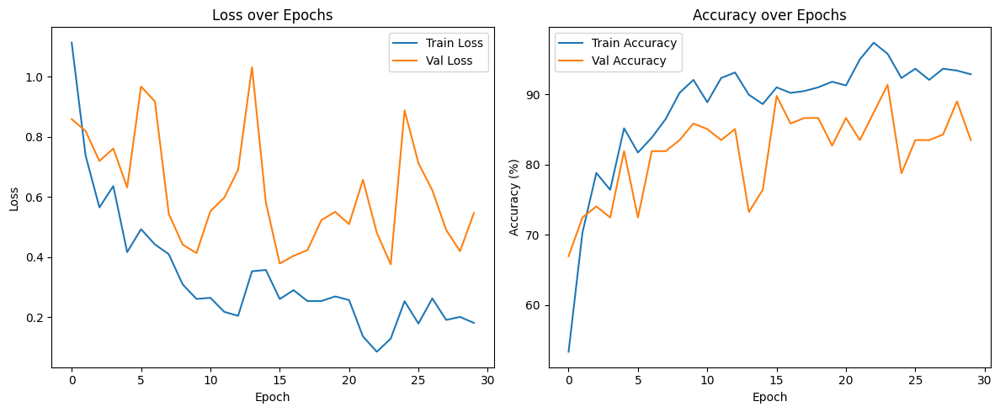

📁 Matriz de confusión guardada en: runs/efficientnet_b0_20250716_125738\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

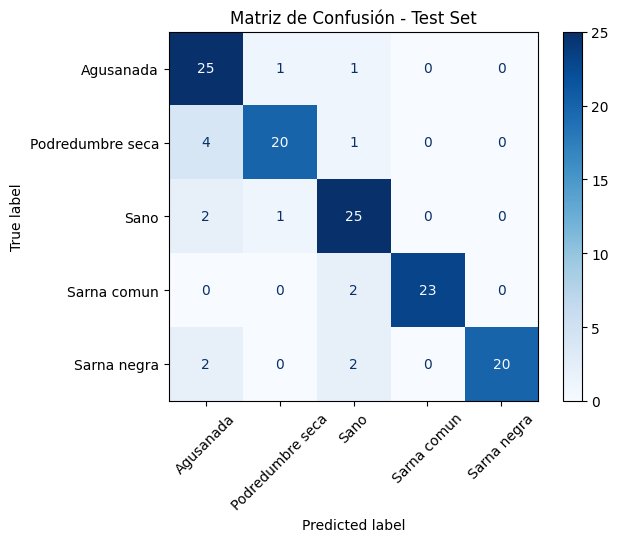

📁 Curva ROC guardada en: runs/efficientnet_b0_20250716_125738\roc_auc_curve.png


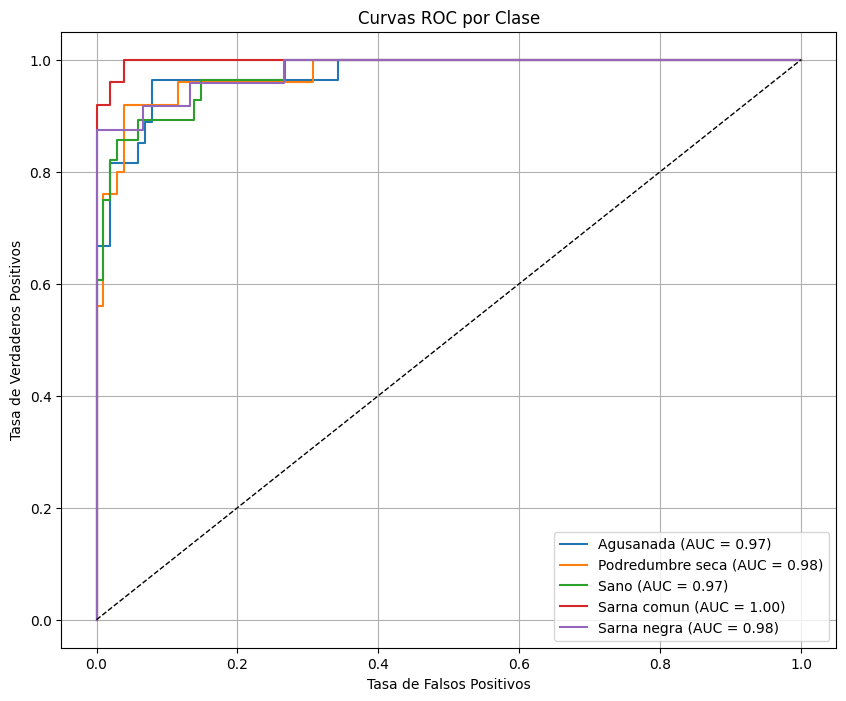

📁 Ejemplos mal clasificados guardados en: runs/efficientnet_b0_20250716_125738\misclassified_examples.png


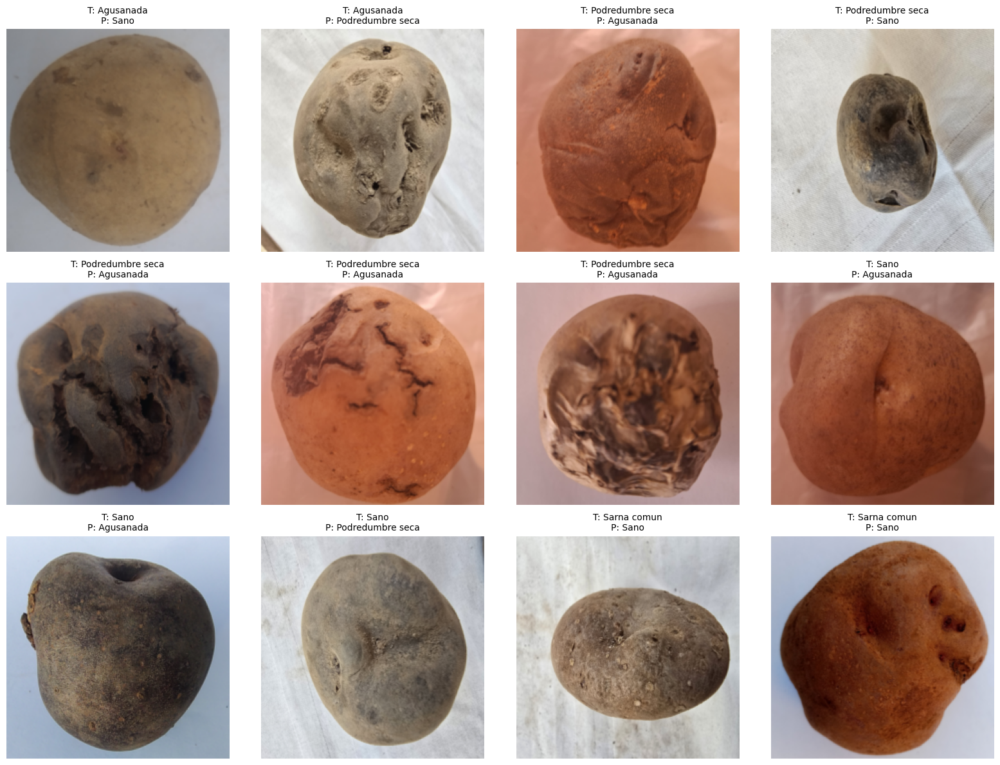


✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,efficientnet_b0,30,16,0.001,87.596899,702.079989,runs/efficientnet_b0_20250716_125738,False,None,None


In [17]:
model_configs = [
    {"model_name": "efficientnet_b0", "img_size": 224, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_0 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_0

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos).

In [18]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Obtener transformaciones
_, val_test_transforms = get_transforms(img_size=224)

test_dataset = datasets.ImageFolder(test_dir, transform=val_test_transforms)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Obtener nombres de clases
class_names = test_dataset.classes

In [19]:
# Cargar arquitectura y pesos del modelo
model_name = "efficientnet_b0"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/efficientnet_b0_20250716_125738/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\3785247952.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during un

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

📁 Gráfico guardado en: runs/efficientnet_b0_20250716_125738/precision_por_clase.png

📊 Macro Precision:    0.8946
📊 Weighted Precision: 0.8896


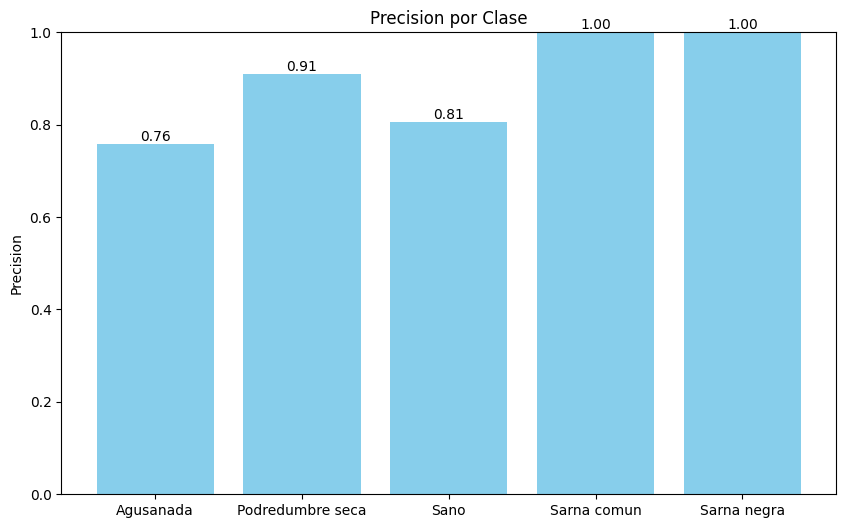

In [20]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/efficientnet_b0_20250716_125738/")

📁 Gráfico guardado en: runs/efficientnet_b0_20250716_125738/recall_por_clase.png

📊 Macro Recall:    0.8744
📊 Weighted Recall: 0.8760


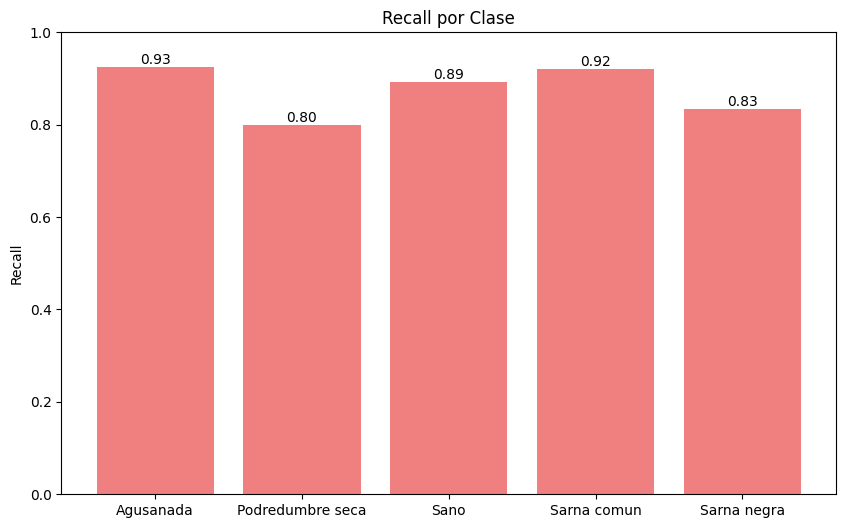

In [21]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/efficientnet_b0_20250716_125738/")

📁 Gráfico guardado en: runs/efficientnet_b0_20250716_125738/f1_score_por_clase.png

📊 Macro F1-Score:    0.8799
📊 Weighted F1-Score: 0.8782


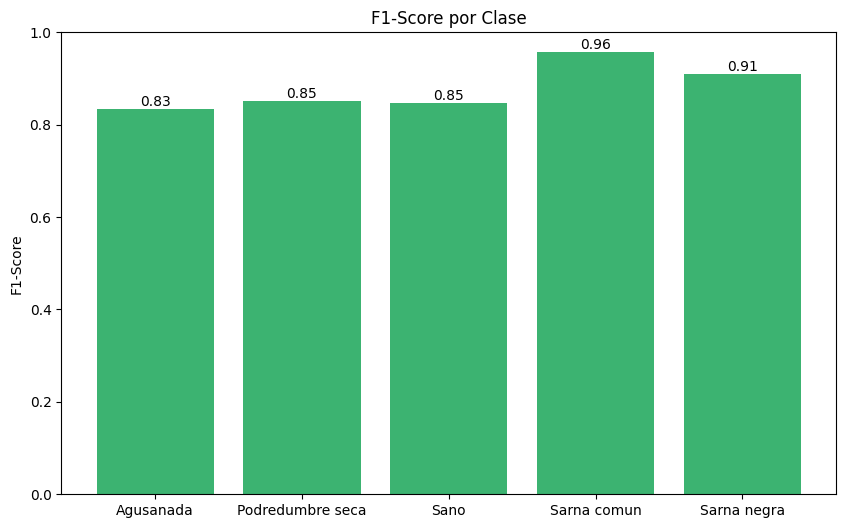

In [22]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/efficientnet_b0_20250716_125738/")

### Entrenamos el modelo usando efficientnet_b4

In [ ]:
model_configs = [
    {"model_name": "efficientnet_b4", "img_size": 300, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_1 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_1

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos).

In [23]:
# Cargar arquitectura y pesos del modelo
model_name = "efficientnet_b4"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/efficientnet_b4_20250716_143147/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\1433149706.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during un

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

📁 Gráfico guardado en: runs/efficientnet_b4_20250716_143147/precision_por_clase.png

📊 Macro Precision:    0.8700
📊 Weighted Precision: 0.8672


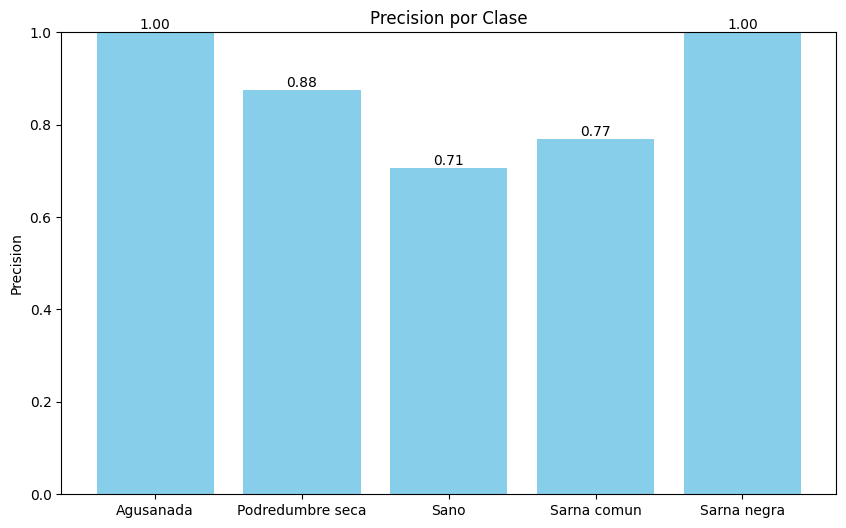

In [24]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/efficientnet_b4_20250716_143147/")

📁 Gráfico guardado en: runs/efficientnet_b4_20250716_143147/recall_por_clase.png

📊 Macro Recall:    0.8513
📊 Weighted Recall: 0.8527


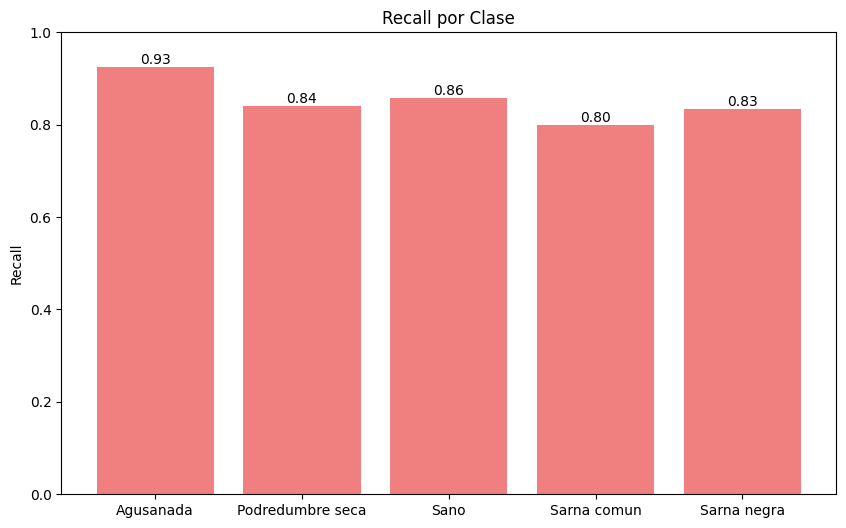

In [25]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/efficientnet_b4_20250716_143147/")

📁 Gráfico guardado en: runs/efficientnet_b4_20250716_143147/f1_score_por_clase.png

📊 Macro F1-Score:    0.8573
📊 Weighted F1-Score: 0.8565


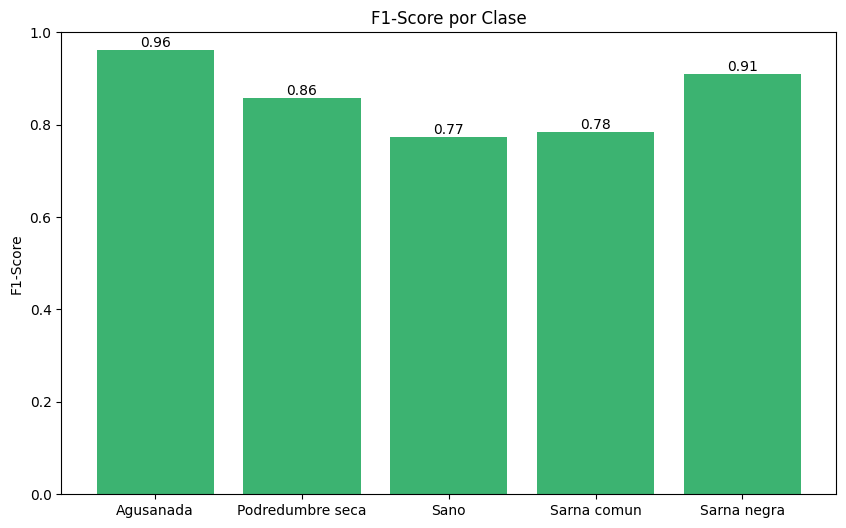

In [26]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/efficientnet_b4_20250716_143147/")

### Entrenamos el modelo usando resnet50


🔧 Entrenando resnet50 | Epochs=30, Batch=16, LR=0.001


📊 Epoch 1/30 | Train Loss: 1.7102 | Train Acc: 30.50% | Val Loss: 3.2026 | Val Acc: 38.58% | ⏱️ 23.14s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 38.58%)


📊 Epoch 2/30 | Train Loss: 1.4040 | Train Acc: 39.52% | Val Loss: 2.0829 | Val Acc: 40.16% | ⏱️ 23.35s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 40.16%)


📊 Epoch 3/30 | Train Loss: 1.2770 | Train Acc: 49.07% | Val Loss: 1.1017 | Val Acc: 55.12% | ⏱️ 22.33s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 55.12%)


📊 Epoch 4/30 | Train Loss: 1.1788 | Train Acc: 54.38% | Val Loss: 1.6927 | Val Acc: 48.03% | ⏱️ 22.83s


📊 Epoch 5/30 | Train Loss: 1.1899 | Train Acc: 53.32% | Val Loss: 1.6767 | Val Acc: 44.09% | ⏱️ 22.52s


📊 Epoch 6/30 | Train Loss: 1.0514 | Train Acc: 57.56% | Val Loss: 0.9455 | Val Acc: 64.57% | ⏱️ 22.40s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 64.57%)


📊 Epoch 7/30 | Train Loss: 0.9660 | Train Acc: 63.40% | Val Loss: 0.8823 | Val Acc: 63.78% | ⏱️ 22.61s


📊 Epoch 8/30 | Train Loss: 0.9430 | Train Acc: 65.25% | Val Loss: 1.0277 | Val Acc: 61.42% | ⏱️ 22.28s


📊 Epoch 9/30 | Train Loss: 0.9266 | Train Acc: 64.99% | Val Loss: 0.7816 | Val Acc: 69.29% | ⏱️ 22.70s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 69.29%)


📊 Epoch 10/30 | Train Loss: 0.8740 | Train Acc: 66.84% | Val Loss: 1.0045 | Val Acc: 59.84% | ⏱️ 22.41s


📊 Epoch 11/30 | Train Loss: 0.9239 | Train Acc: 64.19% | Val Loss: 0.8722 | Val Acc: 64.57% | ⏱️ 22.61s


📊 Epoch 12/30 | Train Loss: 0.8066 | Train Acc: 68.17% | Val Loss: 0.7401 | Val Acc: 71.65% | ⏱️ 22.50s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 71.65%)


📊 Epoch 13/30 | Train Loss: 0.7826 | Train Acc: 68.44% | Val Loss: 1.4462 | Val Acc: 59.84% | ⏱️ 22.24s


📊 Epoch 14/30 | Train Loss: 0.7858 | Train Acc: 70.03% | Val Loss: 0.8143 | Val Acc: 68.50% | ⏱️ 22.46s


📊 Epoch 15/30 | Train Loss: 0.7727 | Train Acc: 69.76% | Val Loss: 0.7860 | Val Acc: 65.35% | ⏱️ 22.24s


📊 Epoch 16/30 | Train Loss: 0.8605 | Train Acc: 68.70% | Val Loss: 0.8971 | Val Acc: 67.72% | ⏱️ 22.17s


📊 Epoch 17/30 | Train Loss: 0.7845 | Train Acc: 69.23% | Val Loss: 0.7195 | Val Acc: 73.23% | ⏱️ 22.53s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 73.23%)


📊 Epoch 18/30 | Train Loss: 0.7845 | Train Acc: 71.35% | Val Loss: 1.0359 | Val Acc: 62.20% | ⏱️ 22.62s


📊 Epoch 19/30 | Train Loss: 0.7287 | Train Acc: 71.09% | Val Loss: 0.6987 | Val Acc: 75.59% | ⏱️ 22.37s
✅ Mejor modelo guardado: runs/resnet50_20250716_145058\best_model.pth (Val Acc: 75.59%)


📊 Epoch 20/30 | Train Loss: 0.6611 | Train Acc: 75.07% | Val Loss: 0.9382 | Val Acc: 68.50% | ⏱️ 22.52s


📊 Epoch 21/30 | Train Loss: 0.7934 | Train Acc: 71.88% | Val Loss: 0.9603 | Val Acc: 72.44% | ⏱️ 22.18s


📊 Epoch 22/30 | Train Loss: 0.7219 | Train Acc: 72.15% | Val Loss: 0.8281 | Val Acc: 70.87% | ⏱️ 22.19s


📊 Epoch 23/30 | Train Loss: 0.5738 | Train Acc: 78.51% | Val Loss: 0.7182 | Val Acc: 74.02% | ⏱️ 22.42s


📊 Epoch 24/30 | Train Loss: 0.6881 | Train Acc: 72.94% | Val Loss: 1.0744 | Val Acc: 66.93% | ⏱️ 22.12s


📊 Epoch 25/30 | Train Loss: 0.6821 | Train Acc: 72.15% | Val Loss: 0.7150 | Val Acc: 73.23% | ⏱️ 21.99s


📊 Epoch 26/30 | Train Loss: 0.6415 | Train Acc: 74.54% | Val Loss: 0.9893 | Val Acc: 63.78% | ⏱️ 22.22s


📊 Epoch 27/30 | Train Loss: 0.5949 | Train Acc: 79.31% | Val Loss: 0.6412 | Val Acc: 75.59% | ⏱️ 22.04s


📊 Epoch 28/30 | Train Loss: 0.6630 | Train Acc: 75.33% | Val Loss: 0.8263 | Val Acc: 72.44% | ⏱️ 22.35s


📊 Epoch 29/30 | Train Loss: 0.7057 | Train Acc: 74.54% | Val Loss: 2.1179 | Val Acc: 59.84% | ⏱️ 22.44s


📊 Epoch 30/30 | Train Loss: 0.8092 | Train Acc: 68.44% | Val Loss: 1.1809 | Val Acc: 59.84% | ⏱️ 22.73s
📁 Historial guardado en runs/resnet50_20250716_145058\training_history.pth
📁 Gráfico de historial guardado en: runs/resnet50_20250716_145058\training_history.png


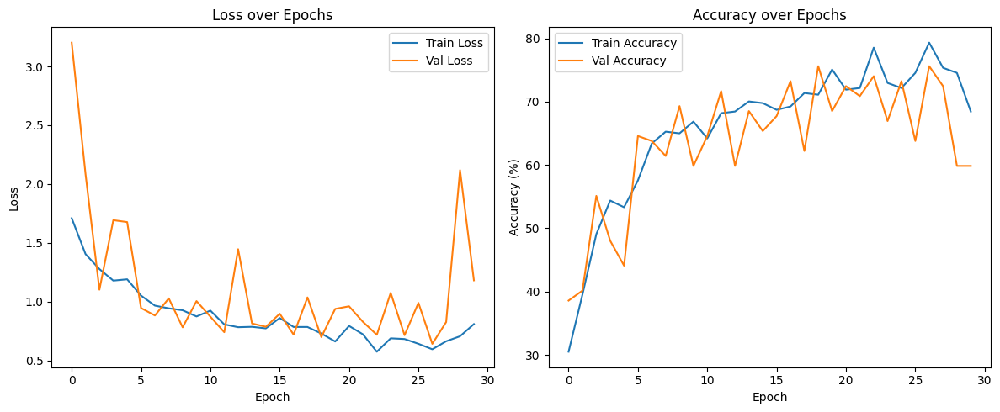

📁 Matriz de confusión guardada en: runs/resnet50_20250716_145058\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

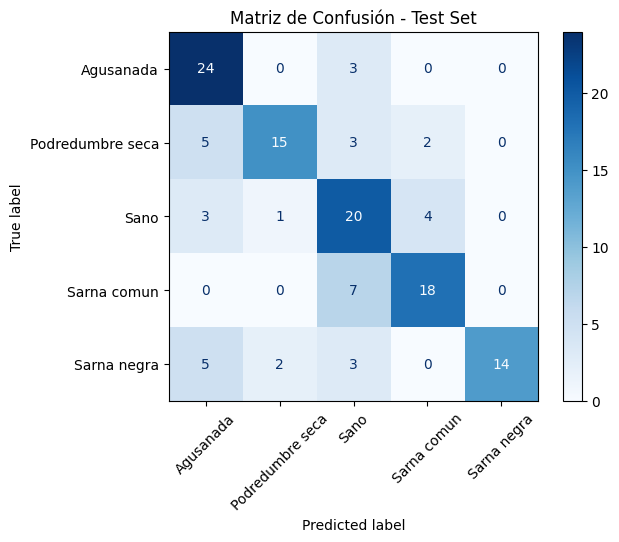

📁 Curva ROC guardada en: runs/resnet50_20250716_145058\roc_auc_curve.png


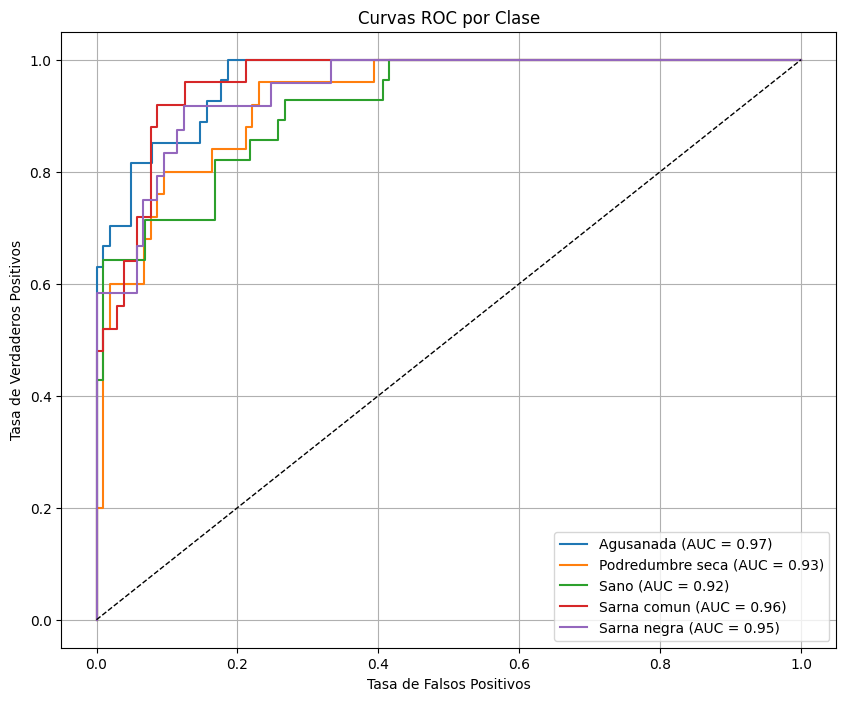

📁 Ejemplos mal clasificados guardados en: runs/resnet50_20250716_145058\misclassified_examples.png


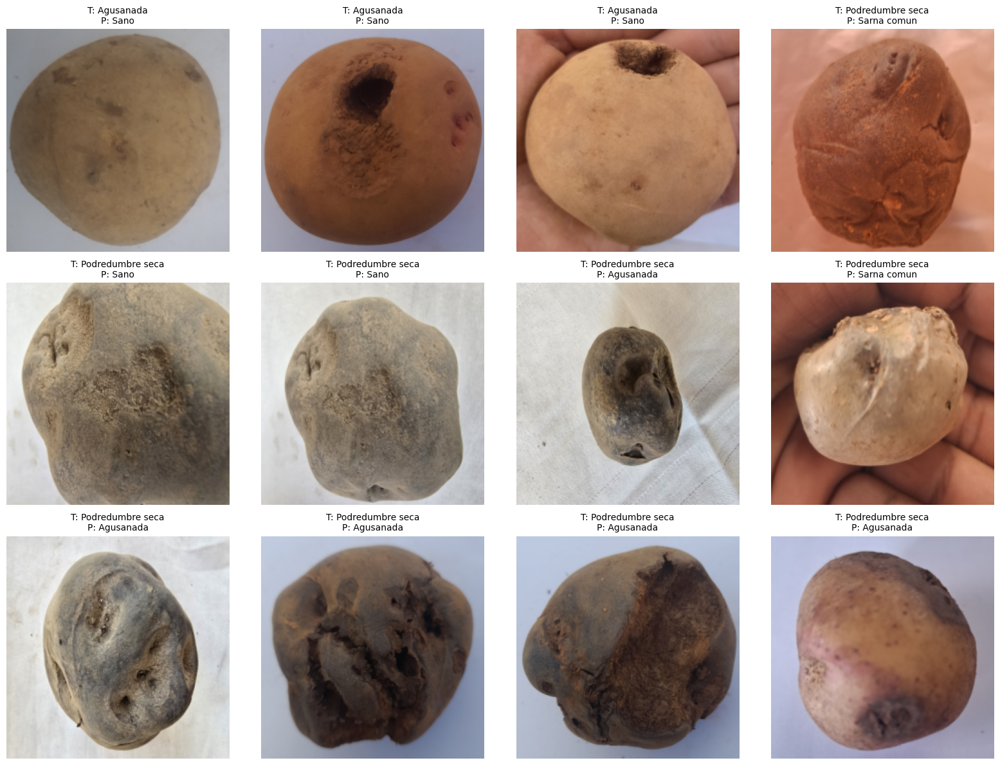


✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,resnet50,30,16,0.001,70.542636,685.084395,runs/resnet50_20250716_145058,False,None,None


In [18]:
model_configs = [
    {"model_name": "resnet50", "img_size": 224, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_2 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_2

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos)

In [27]:
# Cargar arquitectura y pesos del modelo
model_name = "resnet50"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/resnet50_20250716_145058/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\4149509659.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See 

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

📁 Gráfico guardado en: runs/resnet50_20250716_145058/precision_por_clase.png

📊 Macro Precision:    0.7575
📊 Weighted Precision: 0.7492


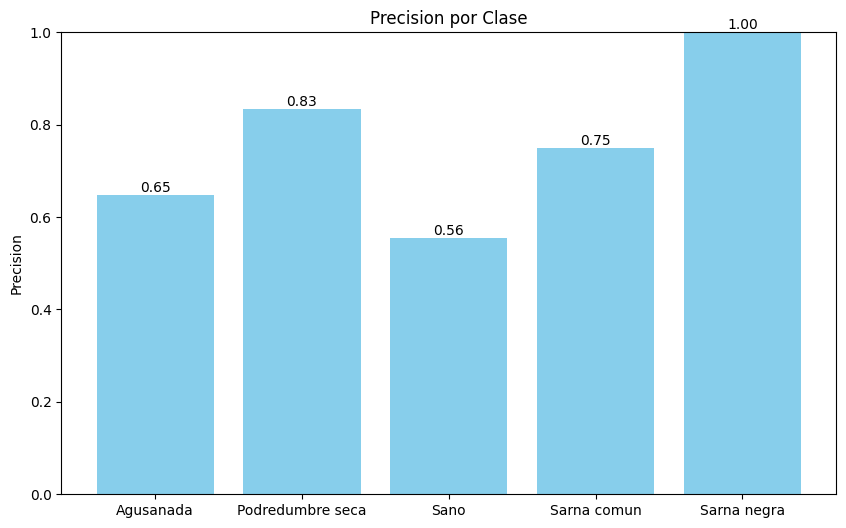

In [28]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/resnet50_20250716_145058/")

📁 Gráfico guardado en: runs/resnet50_20250716_145058/recall_por_clase.png

📊 Macro Recall:    0.7013
📊 Weighted Recall: 0.7054


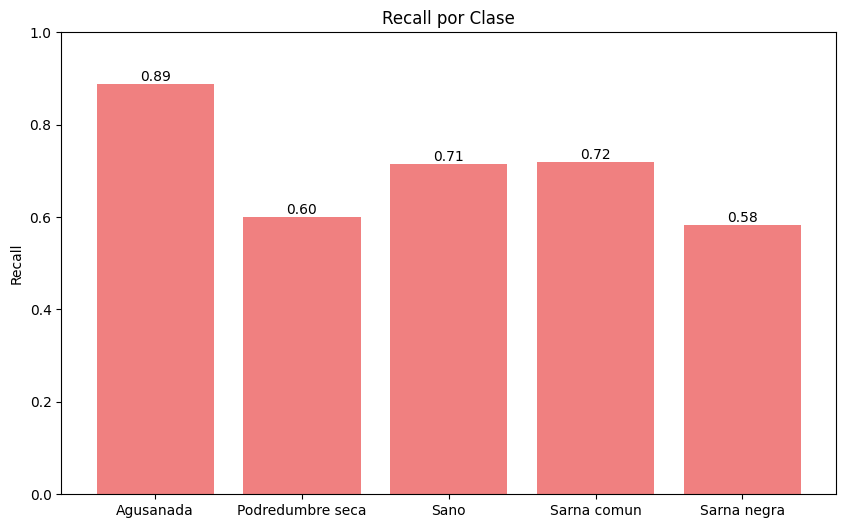

In [29]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/resnet50_20250716_145058/")

📁 Gráfico guardado en: runs/resnet50_20250716_145058/f1_score_por_clase.png

📊 Macro F1-Score:    0.7088
📊 Weighted F1-Score: 0.7073


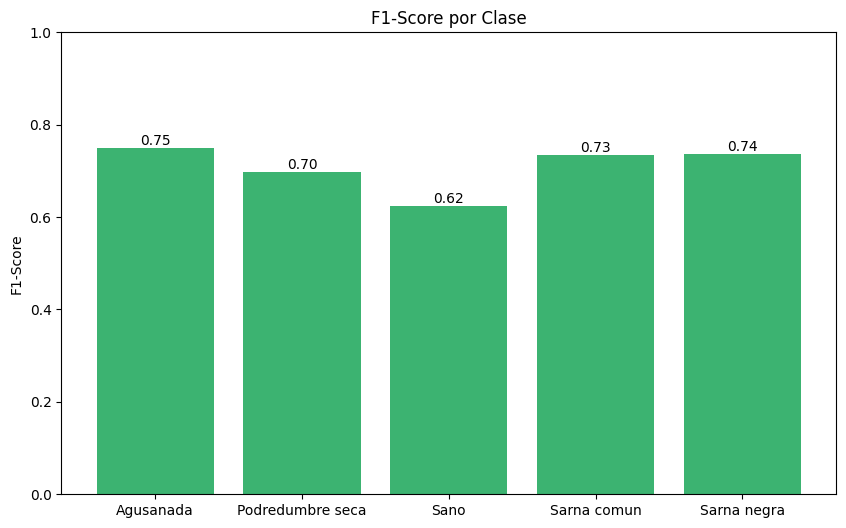

In [30]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/resnet50_20250716_145058/")

### Entrenamos el modelo usando resnet101


🔧 Entrenando resnet101 | Epochs=30, Batch=16, LR=0.001


c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📊 Epoch 1/30 | Train Loss: 1.7900 | Train Acc: 26.79% | Val Loss: 20.4979 | Val Acc: 21.26% | ⏱️ 23.17s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 21.26%)


📊 Epoch 2/30 | Train Loss: 1.5212 | Train Acc: 29.71% | Val Loss: 1.4862 | Val Acc: 37.80% | ⏱️ 23.36s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 37.80%)


📊 Epoch 3/30 | Train Loss: 1.3916 | Train Acc: 37.93% | Val Loss: 1.2380 | Val Acc: 47.24% | ⏱️ 23.40s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 47.24%)


📊 Epoch 4/30 | Train Loss: 1.3117 | Train Acc: 41.11% | Val Loss: 1.5509 | Val Acc: 40.94% | ⏱️ 23.19s


📊 Epoch 5/30 | Train Loss: 1.2181 | Train Acc: 48.81% | Val Loss: 1.5136 | Val Acc: 41.73% | ⏱️ 22.95s


📊 Epoch 6/30 | Train Loss: 1.1970 | Train Acc: 50.13% | Val Loss: 1.3146 | Val Acc: 49.61% | ⏱️ 22.60s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 49.61%)


📊 Epoch 7/30 | Train Loss: 1.1069 | Train Acc: 53.85% | Val Loss: 1.2064 | Val Acc: 48.82% | ⏱️ 22.77s


📊 Epoch 8/30 | Train Loss: 1.1000 | Train Acc: 54.38% | Val Loss: 1.1133 | Val Acc: 48.03% | ⏱️ 22.95s


📊 Epoch 9/30 | Train Loss: 1.0843 | Train Acc: 59.15% | Val Loss: 1.1553 | Val Acc: 48.82% | ⏱️ 22.70s


📊 Epoch 10/30 | Train Loss: 1.1124 | Train Acc: 51.99% | Val Loss: 1.4381 | Val Acc: 41.73% | ⏱️ 23.02s


📊 Epoch 11/30 | Train Loss: 1.0439 | Train Acc: 56.23% | Val Loss: 0.9731 | Val Acc: 58.27% | ⏱️ 22.79s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 58.27%)


📊 Epoch 12/30 | Train Loss: 0.9832 | Train Acc: 57.03% | Val Loss: 0.9161 | Val Acc: 66.14% | ⏱️ 23.63s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 66.14%)


📊 Epoch 13/30 | Train Loss: 0.9620 | Train Acc: 58.89% | Val Loss: 1.1889 | Val Acc: 51.18% | ⏱️ 23.13s


📊 Epoch 14/30 | Train Loss: 0.9401 | Train Acc: 59.68% | Val Loss: 0.9069 | Val Acc: 62.99% | ⏱️ 23.06s


📊 Epoch 15/30 | Train Loss: 0.8535 | Train Acc: 67.90% | Val Loss: 0.9282 | Val Acc: 57.48% | ⏱️ 22.99s


📊 Epoch 16/30 | Train Loss: 0.9165 | Train Acc: 61.27% | Val Loss: 1.0778 | Val Acc: 62.20% | ⏱️ 22.65s


📊 Epoch 17/30 | Train Loss: 0.9165 | Train Acc: 59.42% | Val Loss: 0.8849 | Val Acc: 65.35% | ⏱️ 22.59s


📊 Epoch 18/30 | Train Loss: 0.8112 | Train Acc: 66.84% | Val Loss: 0.6951 | Val Acc: 74.80% | ⏱️ 22.81s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 74.80%)


📊 Epoch 19/30 | Train Loss: 0.8118 | Train Acc: 66.84% | Val Loss: 1.0820 | Val Acc: 62.20% | ⏱️ 23.11s


📊 Epoch 20/30 | Train Loss: 0.8164 | Train Acc: 65.52% | Val Loss: 0.9080 | Val Acc: 59.84% | ⏱️ 22.76s


📊 Epoch 21/30 | Train Loss: 0.8656 | Train Acc: 64.72% | Val Loss: 0.8145 | Val Acc: 68.50% | ⏱️ 22.89s


📊 Epoch 22/30 | Train Loss: 0.7483 | Train Acc: 67.37% | Val Loss: 0.8093 | Val Acc: 74.02% | ⏱️ 23.07s


📊 Epoch 23/30 | Train Loss: 0.8266 | Train Acc: 68.70% | Val Loss: 0.8231 | Val Acc: 65.35% | ⏱️ 23.03s


📊 Epoch 24/30 | Train Loss: 0.7571 | Train Acc: 70.29% | Val Loss: 0.8477 | Val Acc: 68.50% | ⏱️ 23.47s


📊 Epoch 25/30 | Train Loss: 0.7838 | Train Acc: 70.03% | Val Loss: 0.7148 | Val Acc: 72.44% | ⏱️ 23.06s


📊 Epoch 26/30 | Train Loss: 0.8130 | Train Acc: 64.72% | Val Loss: 0.9066 | Val Acc: 66.14% | ⏱️ 22.73s


📊 Epoch 27/30 | Train Loss: 0.7943 | Train Acc: 68.70% | Val Loss: 0.9060 | Val Acc: 66.93% | ⏱️ 22.64s


📊 Epoch 28/30 | Train Loss: 0.6693 | Train Acc: 74.27% | Val Loss: 0.7933 | Val Acc: 70.08% | ⏱️ 23.14s


📊 Epoch 29/30 | Train Loss: 0.6294 | Train Acc: 76.13% | Val Loss: 0.6481 | Val Acc: 76.38% | ⏱️ 23.09s
✅ Mejor modelo guardado: runs/resnet101_20250716_152755\best_model.pth (Val Acc: 76.38%)


📊 Epoch 30/30 | Train Loss: 0.6534 | Train Acc: 72.94% | Val Loss: 0.8476 | Val Acc: 72.44% | ⏱️ 22.57s
📁 Historial guardado en runs/resnet101_20250716_152755\training_history.pth
📁 Gráfico de historial guardado en: runs/resnet101_20250716_152755\training_history.png


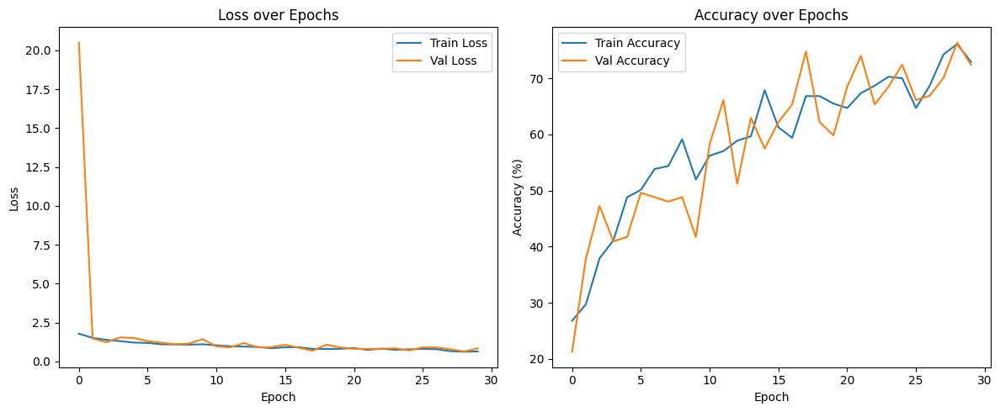

📁 Matriz de confusión guardada en: runs/resnet101_20250716_152755\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

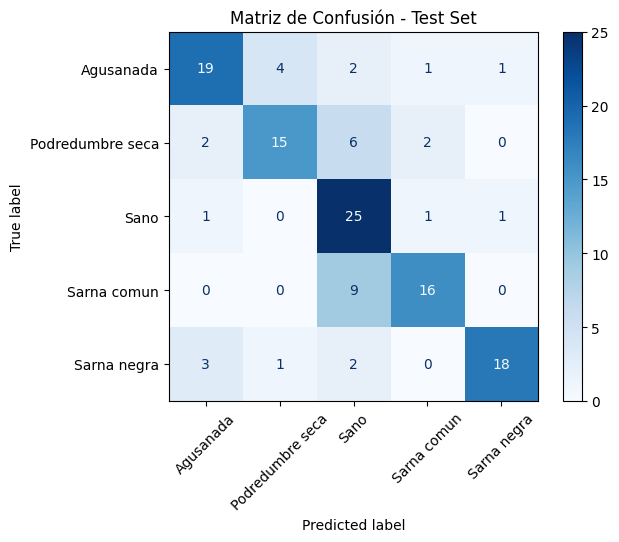

📁 Curva ROC guardada en: runs/resnet101_20250716_152755\roc_auc_curve.png


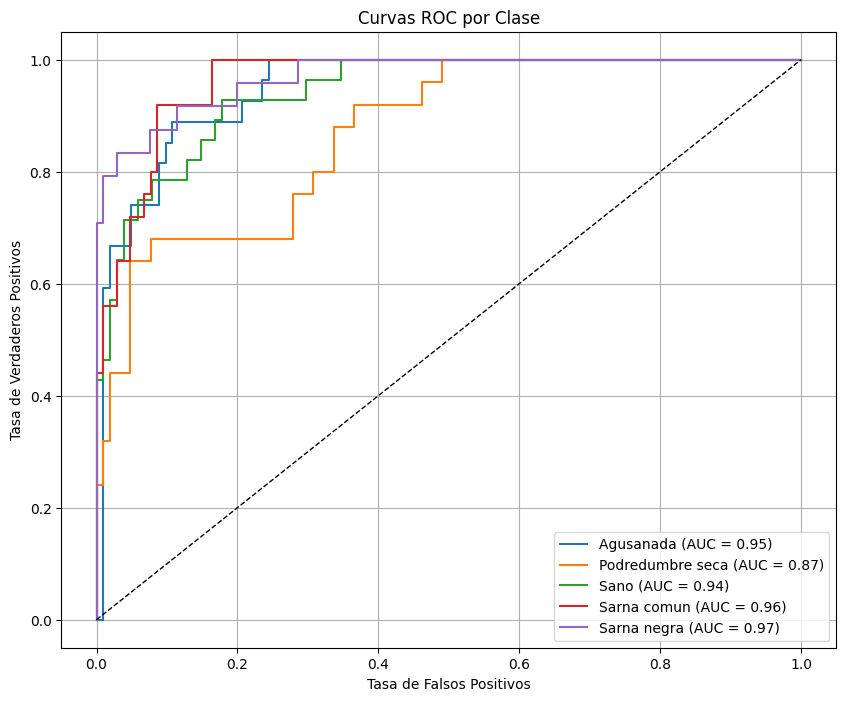

📁 Ejemplos mal clasificados guardados en: runs/resnet101_20250716_152755\misclassified_examples.png


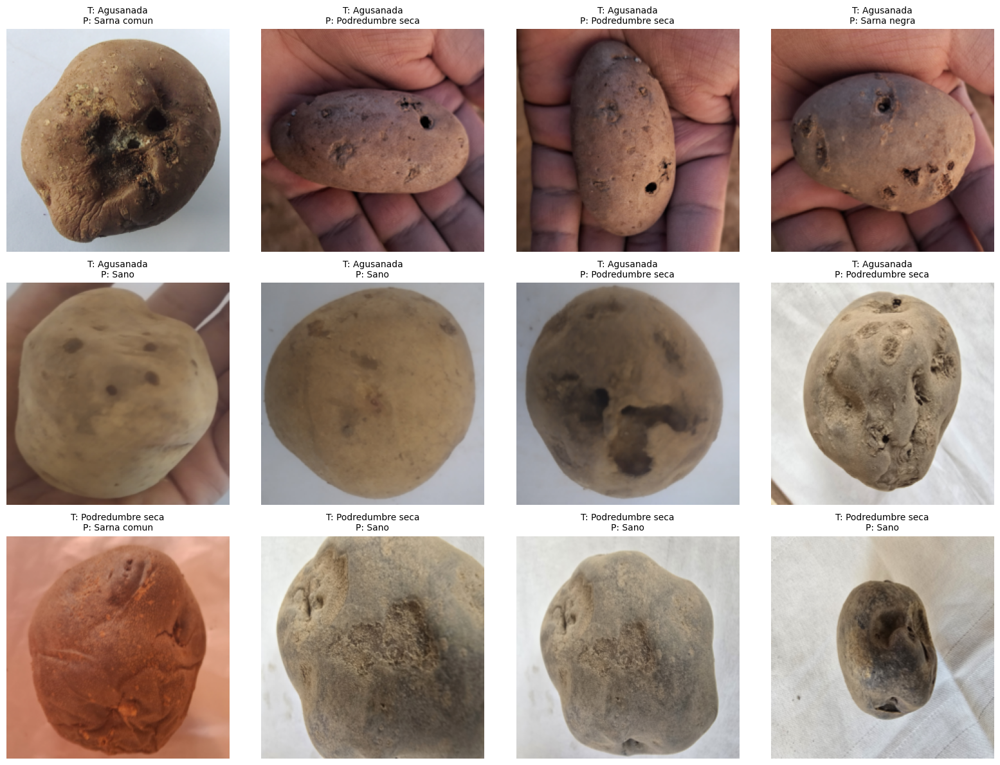


✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,resnet101,30,16,0.001,72.093023,691.697673,runs/resnet101_20250716_152755,False,None,None


In [16]:
model_configs = [
    {"model_name": "resnet101", "img_size": 224, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_3 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_3

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos).

In [31]:
# Cargar arquitectura y pesos del modelo
model_name = "resnet101"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/resnet101_20250716_152755/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\2797418349.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (Se

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

📁 Gráfico guardado en: runs/resnet101_20250716_152755/precision_por_clase.png

📊 Macro Precision:    0.7556
📊 Weighted Precision: 0.7502


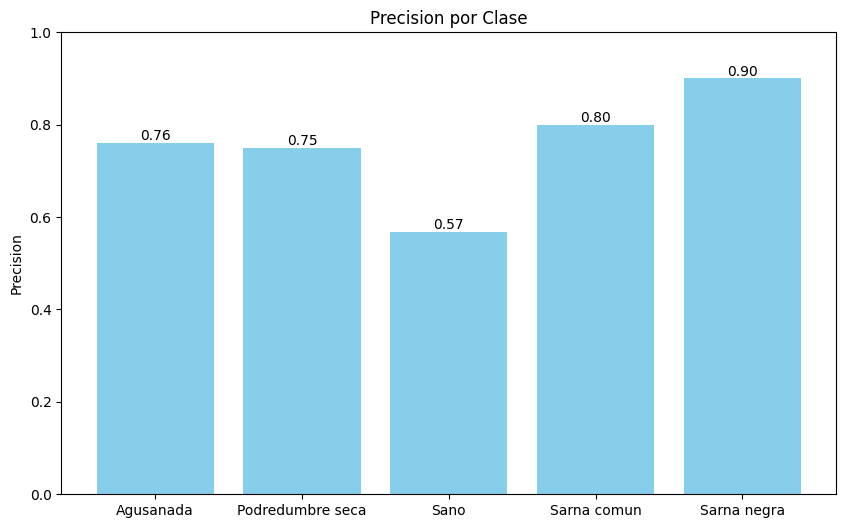

In [32]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/resnet101_20250716_152755/")

📁 Gráfico guardado en: runs/resnet101_20250716_152755/recall_por_clase.png

📊 Macro Recall:    0.7173
📊 Weighted Recall: 0.7209


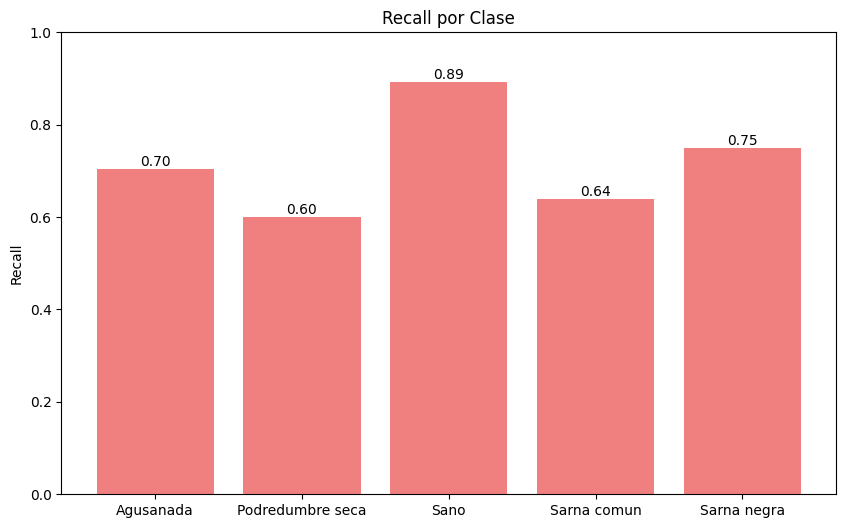

In [33]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/resnet101_20250716_152755/")

📁 Gráfico guardado en: runs/resnet101_20250716_152755/f1_score_por_clase.png

📊 Macro F1-Score:    0.7242
📊 Weighted F1-Score: 0.7229


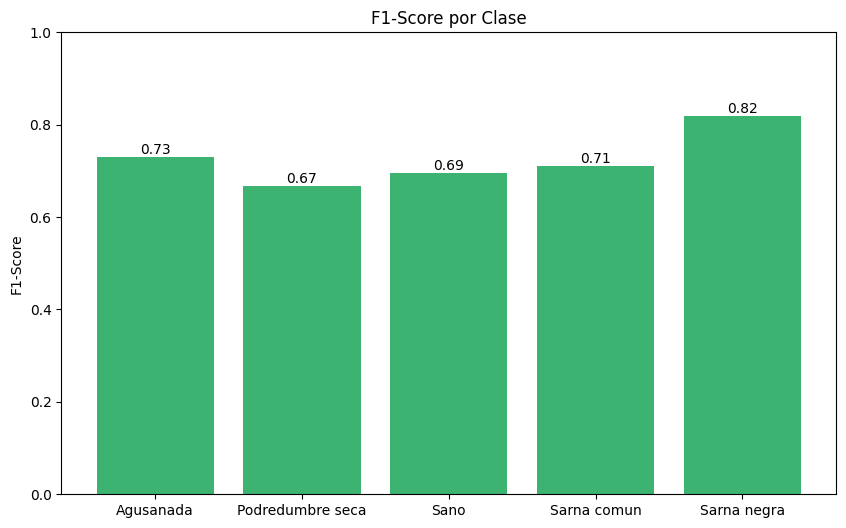

In [34]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/resnet101_20250716_152755/")

### Entrenamos el modelo usando densenet121


🔧 Entrenando densenet121 | Epochs=30, Batch=16, LR=0.001


c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📊 Epoch 1/30 | Train Loss: 1.2640 | Train Acc: 49.60% | Val Loss: 2.0468 | Val Acc: 51.97% | ⏱️ 23.24s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 51.97%)


📊 Epoch 2/30 | Train Loss: 1.0409 | Train Acc: 59.15% | Val Loss: 3.4894 | Val Acc: 39.37% | ⏱️ 22.84s


📊 Epoch 3/30 | Train Loss: 0.8656 | Train Acc: 64.72% | Val Loss: 0.8534 | Val Acc: 71.65% | ⏱️ 22.62s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 71.65%)


📊 Epoch 4/30 | Train Loss: 0.8585 | Train Acc: 67.37% | Val Loss: 0.8227 | Val Acc: 67.72% | ⏱️ 22.81s


📊 Epoch 5/30 | Train Loss: 0.8836 | Train Acc: 64.99% | Val Loss: 0.7947 | Val Acc: 73.23% | ⏱️ 22.34s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 73.23%)


📊 Epoch 6/30 | Train Loss: 0.8304 | Train Acc: 67.11% | Val Loss: 0.7051 | Val Acc: 74.02% | ⏱️ 22.84s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 74.02%)


📊 Epoch 7/30 | Train Loss: 0.6918 | Train Acc: 72.68% | Val Loss: 0.8114 | Val Acc: 69.29% | ⏱️ 22.43s


📊 Epoch 8/30 | Train Loss: 0.7742 | Train Acc: 71.88% | Val Loss: 0.7771 | Val Acc: 69.29% | ⏱️ 22.80s


📊 Epoch 9/30 | Train Loss: 0.8503 | Train Acc: 66.58% | Val Loss: 2.1095 | Val Acc: 55.91% | ⏱️ 22.53s


📊 Epoch 10/30 | Train Loss: 0.6082 | Train Acc: 74.80% | Val Loss: 1.2772 | Val Acc: 65.35% | ⏱️ 22.34s


📊 Epoch 11/30 | Train Loss: 0.6149 | Train Acc: 77.19% | Val Loss: 1.1771 | Val Acc: 70.87% | ⏱️ 22.84s


📊 Epoch 12/30 | Train Loss: 0.6092 | Train Acc: 77.19% | Val Loss: 0.6131 | Val Acc: 77.17% | ⏱️ 22.38s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 77.17%)


📊 Epoch 13/30 | Train Loss: 0.6223 | Train Acc: 72.94% | Val Loss: 0.8812 | Val Acc: 70.87% | ⏱️ 22.35s


📊 Epoch 14/30 | Train Loss: 0.5531 | Train Acc: 80.11% | Val Loss: 0.5553 | Val Acc: 79.53% | ⏱️ 22.53s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 79.53%)


📊 Epoch 15/30 | Train Loss: 0.5709 | Train Acc: 78.25% | Val Loss: 0.7256 | Val Acc: 77.17% | ⏱️ 23.04s


📊 Epoch 16/30 | Train Loss: 0.5184 | Train Acc: 79.84% | Val Loss: 0.6798 | Val Acc: 79.53% | ⏱️ 22.57s


📊 Epoch 17/30 | Train Loss: 0.6001 | Train Acc: 77.19% | Val Loss: 0.5026 | Val Acc: 84.25% | ⏱️ 22.73s
✅ Mejor modelo guardado: runs/densenet121_20250716_180051\best_model.pth (Val Acc: 84.25%)


📊 Epoch 18/30 | Train Loss: 0.4637 | Train Acc: 85.41% | Val Loss: 0.8630 | Val Acc: 69.29% | ⏱️ 22.97s


📊 Epoch 19/30 | Train Loss: 0.5449 | Train Acc: 80.11% | Val Loss: 0.6240 | Val Acc: 79.53% | ⏱️ 22.65s


📊 Epoch 20/30 | Train Loss: 0.5254 | Train Acc: 79.84% | Val Loss: 0.5324 | Val Acc: 79.53% | ⏱️ 22.38s


📊 Epoch 21/30 | Train Loss: 0.4784 | Train Acc: 82.49% | Val Loss: 0.6837 | Val Acc: 76.38% | ⏱️ 22.66s


📊 Epoch 22/30 | Train Loss: 0.4728 | Train Acc: 81.70% | Val Loss: 0.6548 | Val Acc: 78.74% | ⏱️ 22.47s


📊 Epoch 23/30 | Train Loss: 0.4385 | Train Acc: 83.55% | Val Loss: 0.7575 | Val Acc: 78.74% | ⏱️ 22.83s


📊 Epoch 24/30 | Train Loss: 0.4646 | Train Acc: 84.62% | Val Loss: 1.1209 | Val Acc: 71.65% | ⏱️ 22.30s


📊 Epoch 25/30 | Train Loss: 0.4428 | Train Acc: 83.55% | Val Loss: 0.6266 | Val Acc: 77.17% | ⏱️ 22.66s


📊 Epoch 26/30 | Train Loss: 0.4390 | Train Acc: 82.23% | Val Loss: 0.6034 | Val Acc: 77.17% | ⏱️ 22.37s


📊 Epoch 27/30 | Train Loss: 0.4853 | Train Acc: 81.96% | Val Loss: 0.8273 | Val Acc: 70.87% | ⏱️ 22.35s


📊 Epoch 28/30 | Train Loss: 0.4391 | Train Acc: 84.35% | Val Loss: 0.7411 | Val Acc: 72.44% | ⏱️ 22.40s


📊 Epoch 29/30 | Train Loss: 0.4296 | Train Acc: 81.70% | Val Loss: 0.7775 | Val Acc: 78.74% | ⏱️ 22.36s


📊 Epoch 30/30 | Train Loss: 0.3384 | Train Acc: 87.00% | Val Loss: 0.6590 | Val Acc: 77.17% | ⏱️ 22.66s
📁 Historial guardado en runs/densenet121_20250716_180051\training_history.pth
📁 Gráfico de historial guardado en: runs/densenet121_20250716_180051\training_history.png


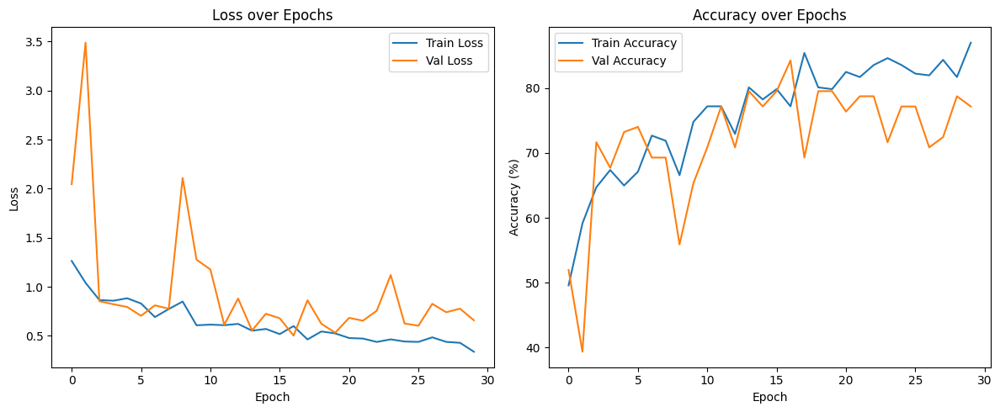

📁 Matriz de confusión guardada en: runs/densenet121_20250716_180051\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

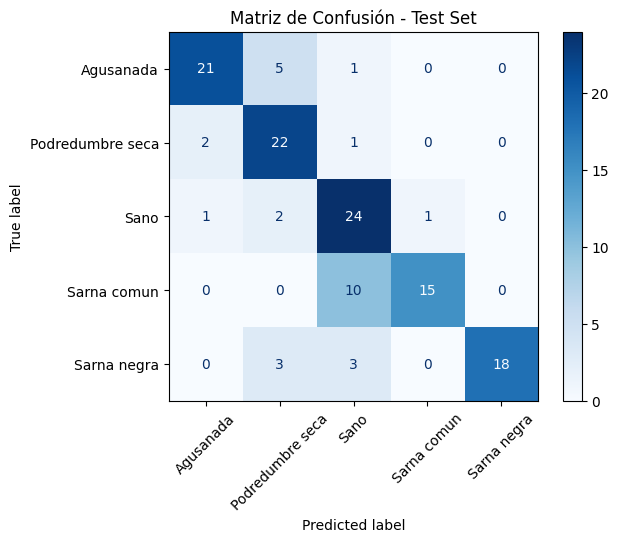

📁 Curva ROC guardada en: runs/densenet121_20250716_180051\roc_auc_curve.png


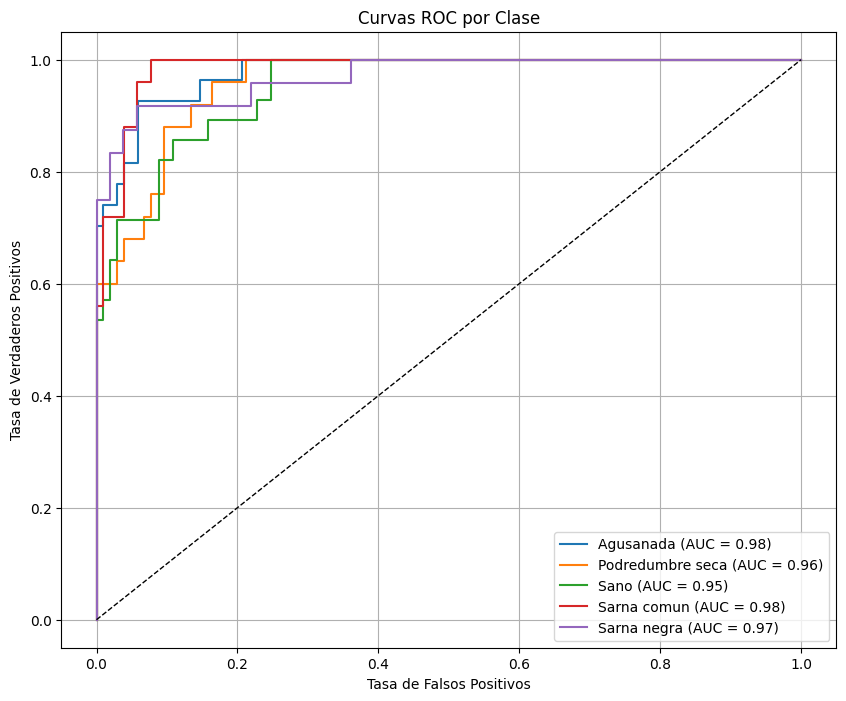

📁 Ejemplos mal clasificados guardados en: runs/densenet121_20250716_180051\misclassified_examples.png


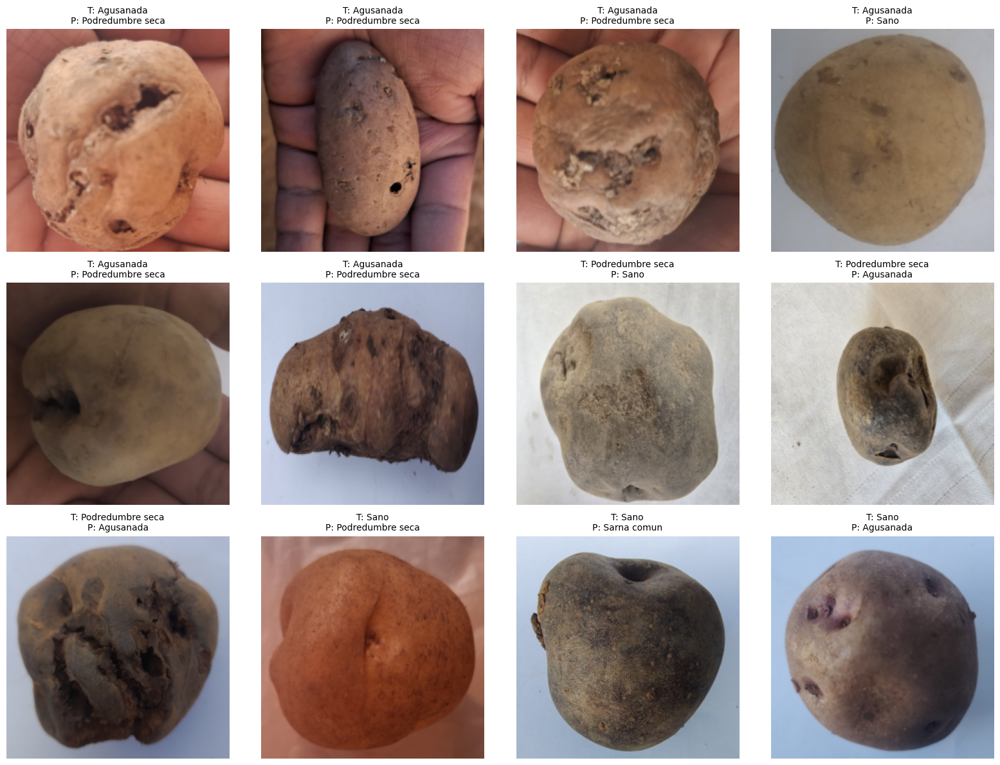


✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,densenet121,30,16,0.001,77.51938,679.291359,runs/densenet121_20250716_180051,False,None,None


In [19]:
model_configs = [
    {"model_name": "densenet121", "img_size": 224, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_4 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_4

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos).

In [35]:
# Cargar arquitectura y pesos del modelo
model_name = "densenet121"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/densenet121_20250716_180051/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\1771361916.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

📁 Gráfico guardado en: runs/densenet121_20250716_180051/precision_por_clase.png

📊 Macro Precision:    0.8231
📊 Weighted Precision: 0.8177


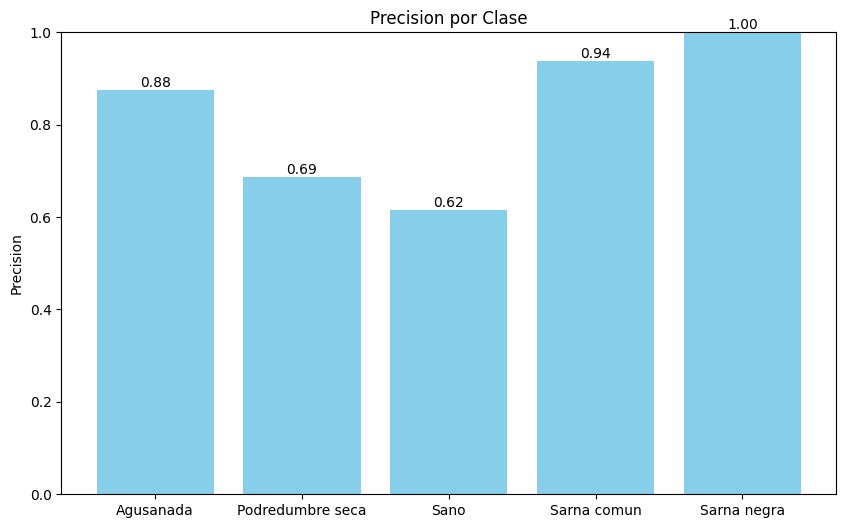

In [36]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/densenet121_20250716_180051/")

📁 Gráfico guardado en: runs/densenet121_20250716_180051/recall_por_clase.png

📊 Macro Recall:    0.7730
📊 Weighted Recall: 0.7752


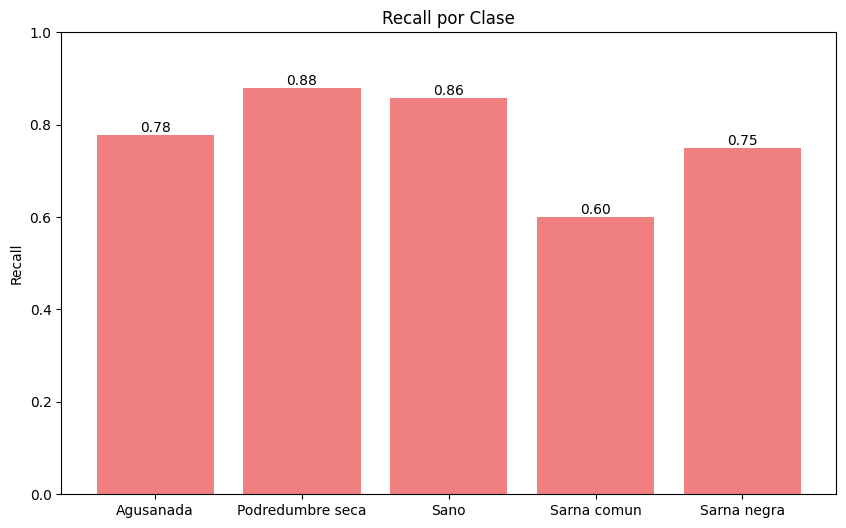

In [37]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/densenet121_20250716_180051/")

📁 Gráfico guardado en: runs/densenet121_20250716_180051/f1_score_por_clase.png

📊 Macro F1-Score:    0.7801
📊 Weighted F1-Score: 0.7787


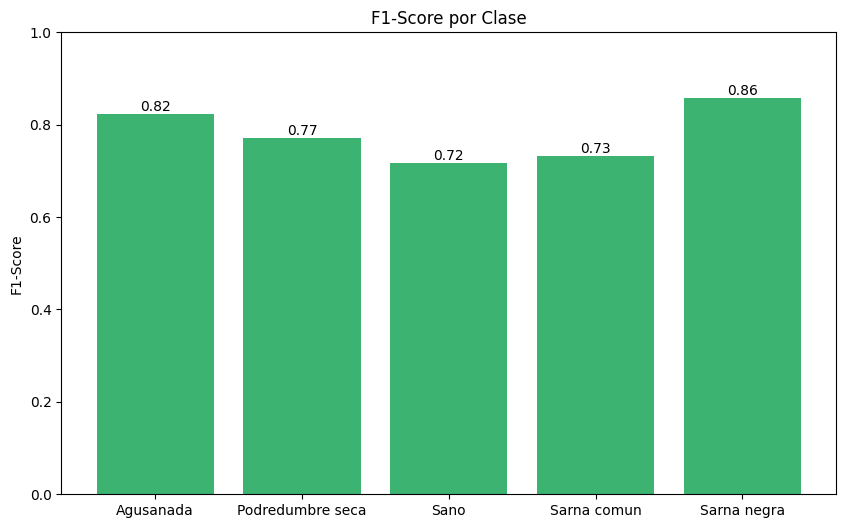

In [38]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/densenet121_20250716_180051/")

### Entrenamos el modelo usando mobilenet_v2


🔧 Entrenando mobilenet_v2 | Epochs=30, Batch=16, LR=0.001


c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📊 Epoch 1/30 | Train Loss: 1.4797 | Train Acc: 42.97% | Val Loss: 2.6057 | Val Acc: 37.80% | ⏱️ 22.43s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 37.80%)


📊 Epoch 2/30 | Train Loss: 1.0870 | Train Acc: 58.36% | Val Loss: 1.0993 | Val Acc: 67.72% | ⏱️ 22.57s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 67.72%)


📊 Epoch 3/30 | Train Loss: 0.9337 | Train Acc: 63.66% | Val Loss: 0.9694 | Val Acc: 63.78% | ⏱️ 22.25s


📊 Epoch 4/30 | Train Loss: 0.8754 | Train Acc: 67.11% | Val Loss: 0.6219 | Val Acc: 80.31% | ⏱️ 22.81s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 80.31%)


📊 Epoch 5/30 | Train Loss: 0.7387 | Train Acc: 73.74% | Val Loss: 0.8519 | Val Acc: 79.53% | ⏱️ 22.31s


📊 Epoch 6/30 | Train Loss: 0.7359 | Train Acc: 69.50% | Val Loss: 0.5768 | Val Acc: 77.95% | ⏱️ 22.15s


📊 Epoch 7/30 | Train Loss: 0.6274 | Train Acc: 75.60% | Val Loss: 0.5419 | Val Acc: 81.10% | ⏱️ 22.77s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 81.10%)


📊 Epoch 8/30 | Train Loss: 0.6888 | Train Acc: 72.41% | Val Loss: 0.9760 | Val Acc: 73.23% | ⏱️ 22.24s


📊 Epoch 9/30 | Train Loss: 0.7481 | Train Acc: 73.47% | Val Loss: 0.9050 | Val Acc: 71.65% | ⏱️ 22.62s


📊 Epoch 10/30 | Train Loss: 0.5623 | Train Acc: 79.31% | Val Loss: 0.7405 | Val Acc: 77.17% | ⏱️ 22.50s


📊 Epoch 11/30 | Train Loss: 0.6641 | Train Acc: 77.45% | Val Loss: 0.9914 | Val Acc: 64.57% | ⏱️ 22.09s


📊 Epoch 12/30 | Train Loss: 0.6482 | Train Acc: 76.13% | Val Loss: 0.7597 | Val Acc: 74.80% | ⏱️ 22.34s


📊 Epoch 13/30 | Train Loss: 0.5919 | Train Acc: 79.58% | Val Loss: 0.5049 | Val Acc: 79.53% | ⏱️ 22.00s


📊 Epoch 14/30 | Train Loss: 0.5612 | Train Acc: 78.51% | Val Loss: 0.5588 | Val Acc: 81.89% | ⏱️ 22.50s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 81.89%)


📊 Epoch 15/30 | Train Loss: 0.4581 | Train Acc: 82.49% | Val Loss: 0.4673 | Val Acc: 77.95% | ⏱️ 22.65s


📊 Epoch 16/30 | Train Loss: 0.3919 | Train Acc: 86.21% | Val Loss: 0.6440 | Val Acc: 84.25% | ⏱️ 22.50s
✅ Mejor modelo guardado: runs/mobilenet_v2_20250716_172524\best_model.pth (Val Acc: 84.25%)


📊 Epoch 17/30 | Train Loss: 0.4458 | Train Acc: 85.15% | Val Loss: 0.5991 | Val Acc: 81.10% | ⏱️ 22.45s


📊 Epoch 18/30 | Train Loss: 0.4045 | Train Acc: 84.62% | Val Loss: 0.8490 | Val Acc: 75.59% | ⏱️ 22.22s


📊 Epoch 19/30 | Train Loss: 0.5377 | Train Acc: 80.64% | Val Loss: 0.8593 | Val Acc: 75.59% | ⏱️ 22.44s


📊 Epoch 20/30 | Train Loss: 0.5851 | Train Acc: 78.25% | Val Loss: 0.8261 | Val Acc: 75.59% | ⏱️ 22.16s


📊 Epoch 21/30 | Train Loss: 0.5705 | Train Acc: 80.11% | Val Loss: 0.8607 | Val Acc: 72.44% | ⏱️ 22.24s


📊 Epoch 22/30 | Train Loss: 0.5035 | Train Acc: 82.49% | Val Loss: 0.6189 | Val Acc: 82.68% | ⏱️ 22.15s


📊 Epoch 23/30 | Train Loss: 0.4201 | Train Acc: 84.62% | Val Loss: 0.5514 | Val Acc: 82.68% | ⏱️ 22.14s


📊 Epoch 24/30 | Train Loss: 0.4225 | Train Acc: 86.21% | Val Loss: 0.5508 | Val Acc: 81.10% | ⏱️ 22.47s


📊 Epoch 25/30 | Train Loss: 0.4506 | Train Acc: 81.17% | Val Loss: 0.5837 | Val Acc: 81.10% | ⏱️ 22.09s


📊 Epoch 26/30 | Train Loss: 0.3476 | Train Acc: 86.21% | Val Loss: 0.4892 | Val Acc: 79.53% | ⏱️ 21.96s


📊 Epoch 27/30 | Train Loss: 0.3030 | Train Acc: 87.27% | Val Loss: 0.4158 | Val Acc: 84.25% | ⏱️ 22.20s


📊 Epoch 28/30 | Train Loss: 0.3567 | Train Acc: 87.53% | Val Loss: 0.5544 | Val Acc: 81.10% | ⏱️ 22.29s


📊 Epoch 29/30 | Train Loss: 0.3124 | Train Acc: 89.12% | Val Loss: 0.4995 | Val Acc: 83.46% | ⏱️ 22.27s


📊 Epoch 30/30 | Train Loss: 0.3074 | Train Acc: 87.27% | Val Loss: 0.5954 | Val Acc: 82.68% | ⏱️ 22.35s
📁 Historial guardado en runs/mobilenet_v2_20250716_172524\training_history.pth
📁 Gráfico de historial guardado en: runs/mobilenet_v2_20250716_172524\training_history.png


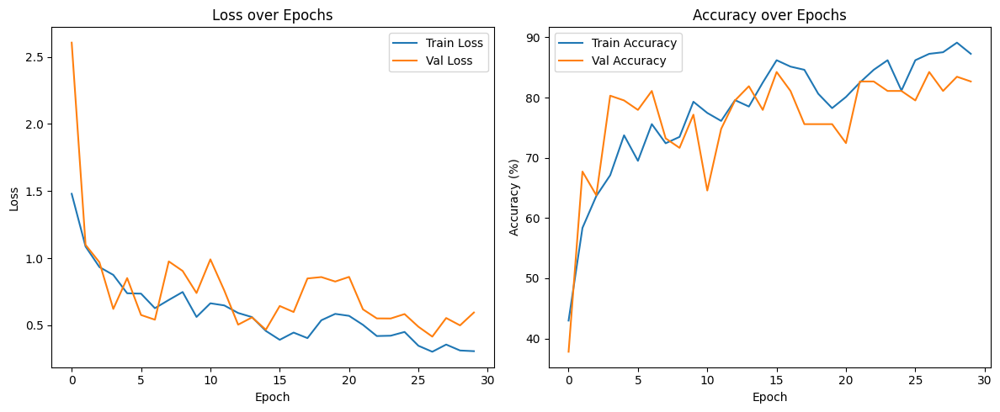

📁 Matriz de confusión guardada en: runs/mobilenet_v2_20250716_172524\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

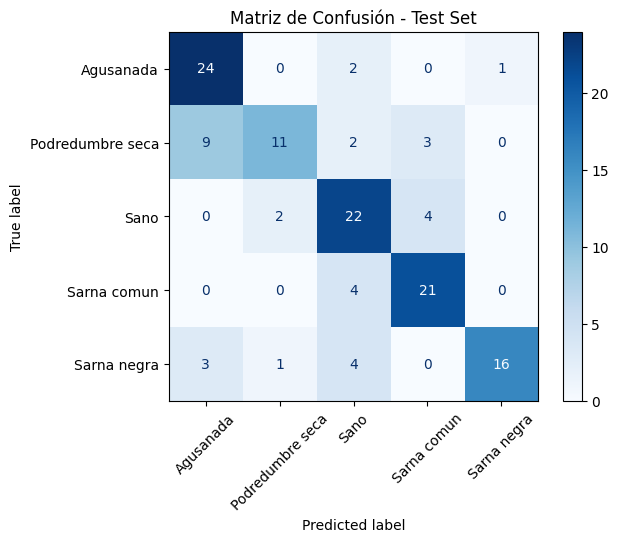

📁 Curva ROC guardada en: runs/mobilenet_v2_20250716_172524\roc_auc_curve.png


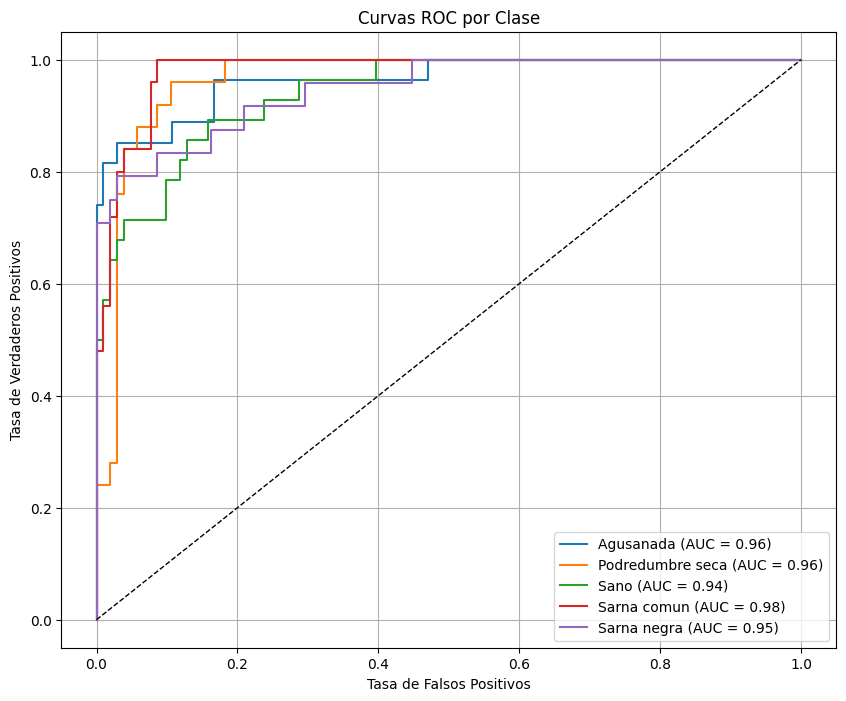

📁 Ejemplos mal clasificados guardados en: runs/mobilenet_v2_20250716_172524\misclassified_examples.png


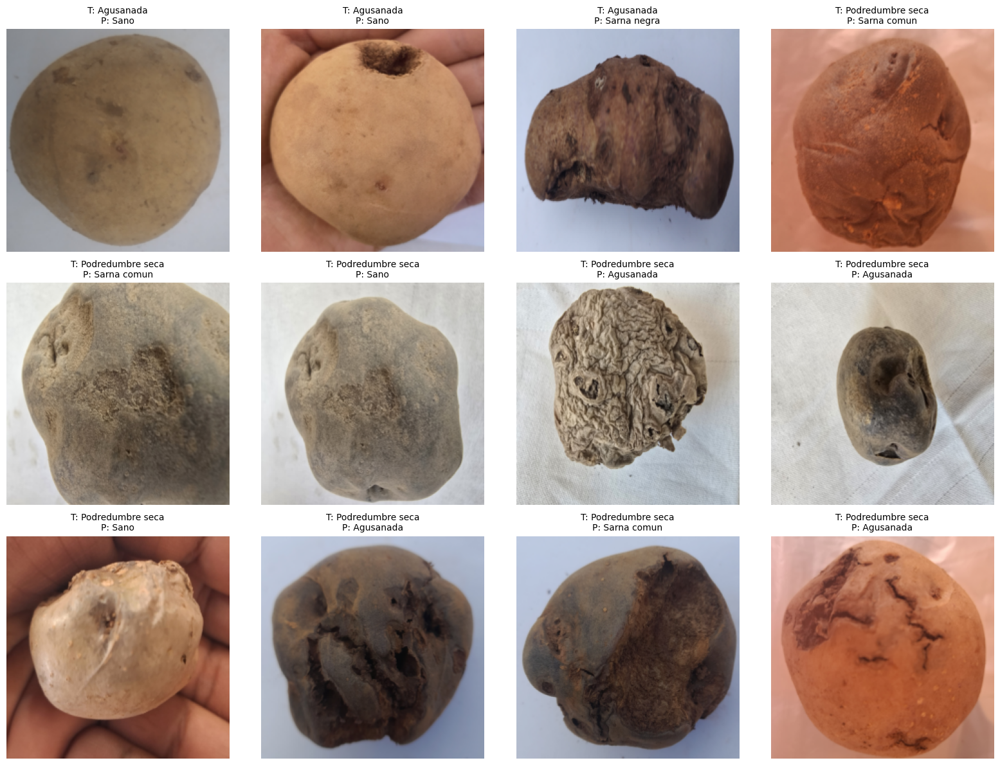


✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,mobilenet_v2,30,16,0.001,72.868217,670.573122,runs/mobilenet_v2_20250716_172524,False,None,None


In [18]:
model_configs = [
    {"model_name": "mobilenet_v2", "img_size": 224, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_5 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_5

### Esta sección se hizo, porque se olvide integrar las metricas de : precision, recall y f1-score (Ignorar o eliminar para futuros entrenamientos).

In [40]:
# Cargar arquitectura y pesos del modelo
model_name = "mobilenet_v2"
num_classes = 5  # Cambia si tu clasificación tiene otro número de clases
model_path = "runs/mobilenet_v2_20250716_172524/best_model.pth"

# Cargar modelo con pesos entrenados
model = load_pretrained_model(model_name, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\HP\AppData\Local\Temp\ipykernel_13240\1678441134.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickli

MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

📁 Gráfico guardado en: runs/mobilenet_v2_20250716_172524/precision_por_clase.png

📊 Macro Precision:    0.7581
📊 Weighted Precision: 0.7527


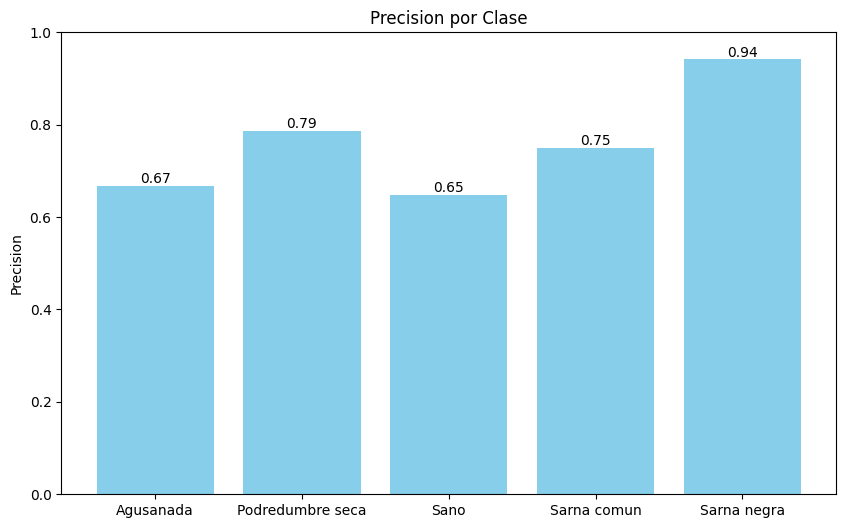

In [41]:
# Precision
evaluate_precision(model, test_loader, device, class_names, savedir="runs/mobilenet_v2_20250716_172524/")

📁 Gráfico guardado en: runs/mobilenet_v2_20250716_172524/recall_por_clase.png

📊 Macro Recall:    0.7243
📊 Weighted Recall: 0.7287


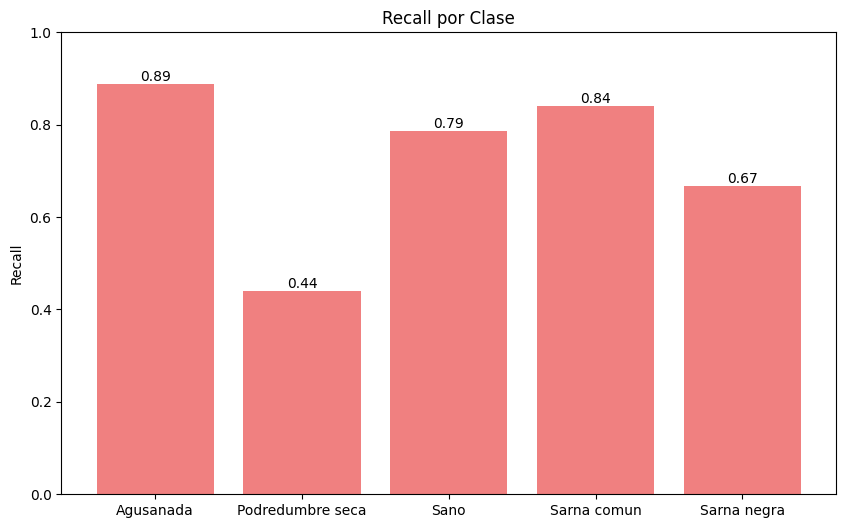

In [42]:
# Recall
evaluate_recall(model, test_loader, device, class_names, savedir="runs/mobilenet_v2_20250716_172524/")

📁 Gráfico guardado en: runs/mobilenet_v2_20250716_172524/f1_score_por_clase.png

📊 Macro F1-Score:    0.7217
📊 Weighted F1-Score: 0.7216


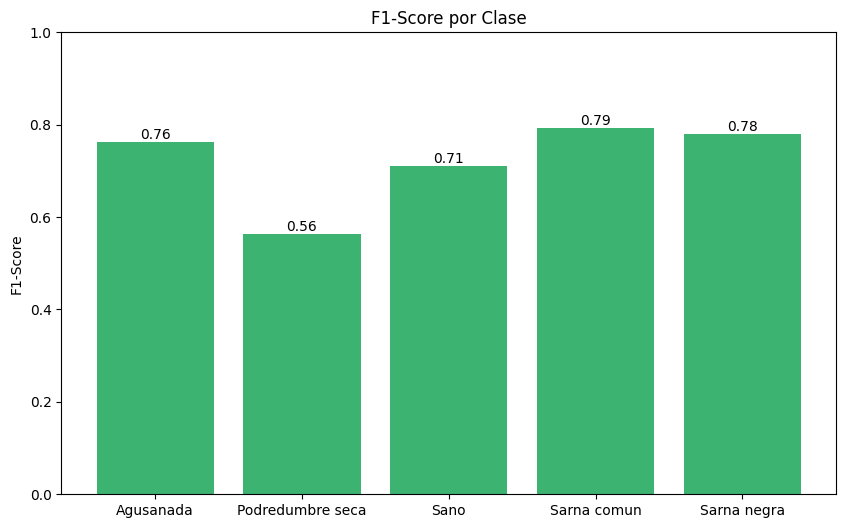

In [43]:
# F1-score
evaluate_f1_score(model, test_loader, device, class_names, savedir="runs/mobilenet_v2_20250716_172524/")

### Entrenamos el modelo usando inception_v3


🔧 Entrenando inception_v3 | Epochs=30, Batch=16, LR=0.001


c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📊 Epoch 1/30 | Train Loss: 2.4260 | Train Acc: 47.75% | Val Loss: 36.2443 | Val Acc: 36.22% | ⏱️ 30.04s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 36.22%)


📊 Epoch 2/30 | Train Loss: 1.8424 | Train Acc: 50.93% | Val Loss: 10.9096 | Val Acc: 64.57% | ⏱️ 25.19s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 64.57%)


📊 Epoch 3/30 | Train Loss: 1.5568 | Train Acc: 55.97% | Val Loss: 0.8009 | Val Acc: 70.87% | ⏱️ 24.86s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 70.87%)


📊 Epoch 4/30 | Train Loss: 1.3138 | Train Acc: 66.05% | Val Loss: 0.7123 | Val Acc: 74.80% | ⏱️ 24.77s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 74.80%)


📊 Epoch 5/30 | Train Loss: 1.1935 | Train Acc: 69.23% | Val Loss: 0.8661 | Val Acc: 69.29% | ⏱️ 24.77s


📊 Epoch 6/30 | Train Loss: 1.3263 | Train Acc: 65.52% | Val Loss: 1.3050 | Val Acc: 62.99% | ⏱️ 24.45s


📊 Epoch 7/30 | Train Loss: 1.0909 | Train Acc: 74.54% | Val Loss: 0.6852 | Val Acc: 74.80% | ⏱️ 24.27s


📊 Epoch 8/30 | Train Loss: 1.0934 | Train Acc: 71.88% | Val Loss: 0.8634 | Val Acc: 70.08% | ⏱️ 24.91s


📊 Epoch 9/30 | Train Loss: 1.0093 | Train Acc: 73.21% | Val Loss: 0.9396 | Val Acc: 68.50% | ⏱️ 25.13s


📊 Epoch 10/30 | Train Loss: 0.9824 | Train Acc: 77.19% | Val Loss: 3.6135 | Val Acc: 55.91% | ⏱️ 24.77s


📊 Epoch 11/30 | Train Loss: 1.0421 | Train Acc: 74.80% | Val Loss: 3.0635 | Val Acc: 62.99% | ⏱️ 24.65s


📊 Epoch 12/30 | Train Loss: 0.9844 | Train Acc: 74.27% | Val Loss: 1.8026 | Val Acc: 58.27% | ⏱️ 24.81s


📊 Epoch 13/30 | Train Loss: 0.8528 | Train Acc: 75.60% | Val Loss: 0.6537 | Val Acc: 74.80% | ⏱️ 24.89s


📊 Epoch 14/30 | Train Loss: 0.8747 | Train Acc: 78.25% | Val Loss: 0.6957 | Val Acc: 73.23% | ⏱️ 24.84s


📊 Epoch 15/30 | Train Loss: 0.7619 | Train Acc: 83.29% | Val Loss: 0.6977 | Val Acc: 78.74% | ⏱️ 24.52s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 78.74%)


📊 Epoch 16/30 | Train Loss: 0.9633 | Train Acc: 77.19% | Val Loss: 1.0740 | Val Acc: 68.50% | ⏱️ 25.12s


📊 Epoch 17/30 | Train Loss: 0.7388 | Train Acc: 84.88% | Val Loss: 0.7058 | Val Acc: 71.65% | ⏱️ 24.75s


📊 Epoch 18/30 | Train Loss: 0.7574 | Train Acc: 83.55% | Val Loss: 0.8416 | Val Acc: 73.23% | ⏱️ 25.18s


📊 Epoch 19/30 | Train Loss: 0.9196 | Train Acc: 77.98% | Val Loss: 0.6515 | Val Acc: 77.95% | ⏱️ 24.59s


📊 Epoch 20/30 | Train Loss: 0.6986 | Train Acc: 83.02% | Val Loss: 0.5657 | Val Acc: 82.68% | ⏱️ 24.65s
✅ Mejor modelo guardado: runs/inception_v3_20250716_220413\best_model.pth (Val Acc: 82.68%)


📊 Epoch 21/30 | Train Loss: 0.5788 | Train Acc: 85.15% | Val Loss: 0.7116 | Val Acc: 81.10% | ⏱️ 24.69s


📊 Epoch 22/30 | Train Loss: 0.7344 | Train Acc: 82.23% | Val Loss: 0.6853 | Val Acc: 75.59% | ⏱️ 25.20s


📊 Epoch 23/30 | Train Loss: 0.5685 | Train Acc: 86.21% | Val Loss: 0.6236 | Val Acc: 77.17% | ⏱️ 24.63s


📊 Epoch 24/30 | Train Loss: 0.6933 | Train Acc: 80.64% | Val Loss: 0.5916 | Val Acc: 81.89% | ⏱️ 24.83s


📊 Epoch 25/30 | Train Loss: 0.5789 | Train Acc: 84.88% | Val Loss: 0.6797 | Val Acc: 81.10% | ⏱️ 24.75s


📊 Epoch 26/30 | Train Loss: 0.5587 | Train Acc: 86.74% | Val Loss: 1.1096 | Val Acc: 70.08% | ⏱️ 24.96s


📊 Epoch 27/30 | Train Loss: 0.6301 | Train Acc: 82.23% | Val Loss: 0.8662 | Val Acc: 74.02% | ⏱️ 24.80s


📊 Epoch 28/30 | Train Loss: 0.5889 | Train Acc: 85.68% | Val Loss: 1.3357 | Val Acc: 72.44% | ⏱️ 24.98s


📊 Epoch 29/30 | Train Loss: 0.7042 | Train Acc: 80.64% | Val Loss: 0.8740 | Val Acc: 81.89% | ⏱️ 24.79s


📊 Epoch 30/30 | Train Loss: 0.6169 | Train Acc: 85.94% | Val Loss: 0.4869 | Val Acc: 81.10% | ⏱️ 24.88s
📁 Historial guardado en runs/inception_v3_20250716_220413\training_history.pth
📁 Gráfico de historial guardado en: runs/inception_v3_20250716_220413\training_history.png


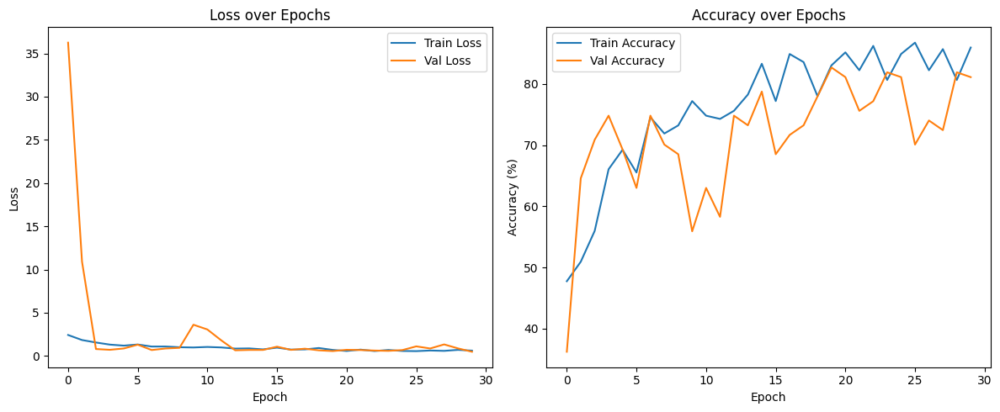

📁 Matriz de confusión guardada en: runs/inception_v3_20250716_220413\confusion_matrix.png


<Figure size 800x600 with 0 Axes>

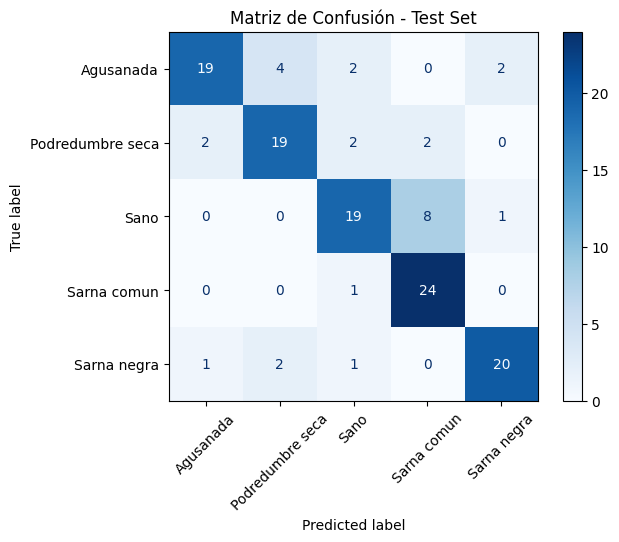

📁 Curva ROC guardada en: runs/inception_v3_20250716_220413\roc_auc_curve.png


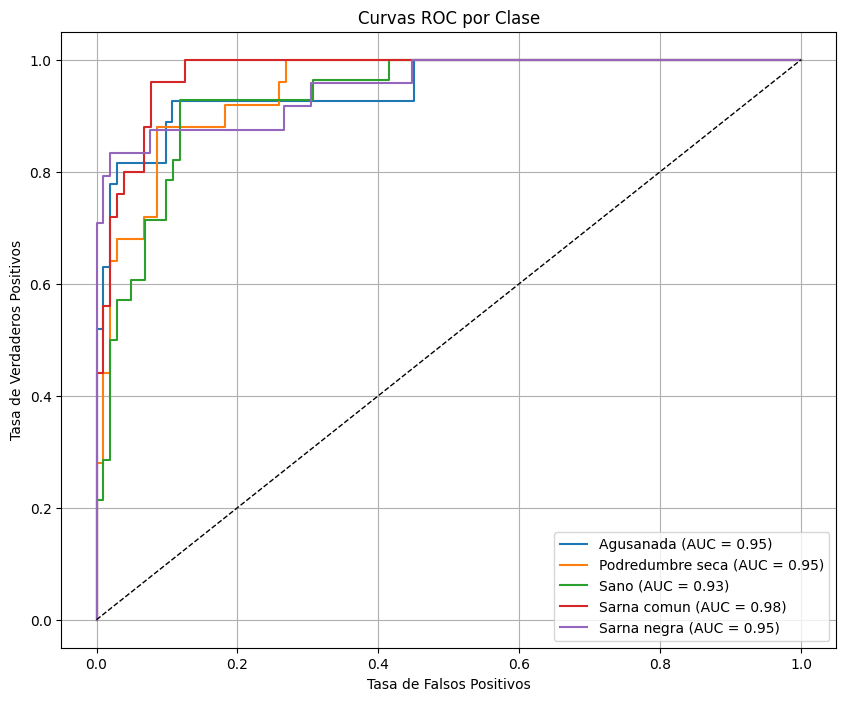

📁 Ejemplos mal clasificados guardados en: runs/inception_v3_20250716_220413\misclassified_examples.png


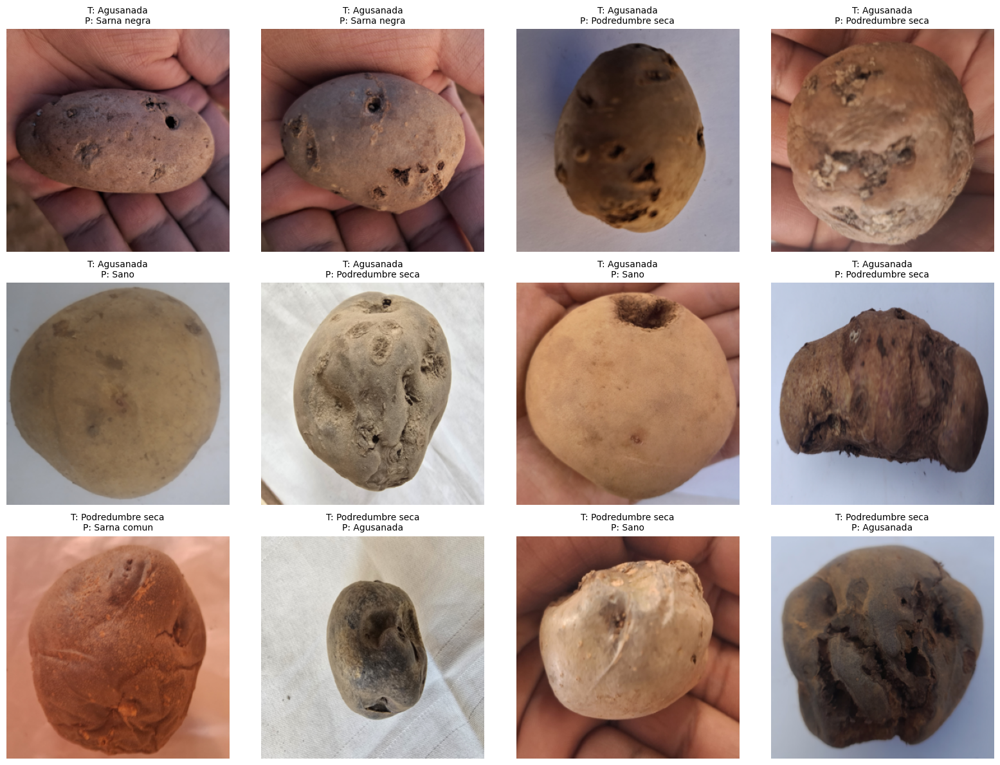

📁 Gráfico guardado en: runs/inception_v3_20250716_220413\precision_por_clase.png

📊 Macro Precision:    0.7918
📊 Weighted Precision: 0.7916
📁 Gráfico guardado en: runs/inception_v3_20250716_220413\recall_por_clase.png

📊 Macro Recall:    0.7871
📊 Weighted Recall: 0.7829
📁 Gráfico guardado en: runs/inception_v3_20250716_220413\f1_score_por_clase.png

📊 Macro F1-Score:    0.7834
📊 Weighted F1-Score: 0.7812

✅ Resultados guardados/actualizados en results_summary_20250716_130955.csv

✅ Resultados guardados en results_summary_20250716_130955.csv


,model_name,epochs,batch_size,learning_rate,test_accuracy,training_time_sec,save_dir,early_stopping,scheduler_type,clip_grad_norm
0,inception_v3,30,16,0.001,78.294574,750.936317,runs/inception_v3_20250716_220413,False,None,None


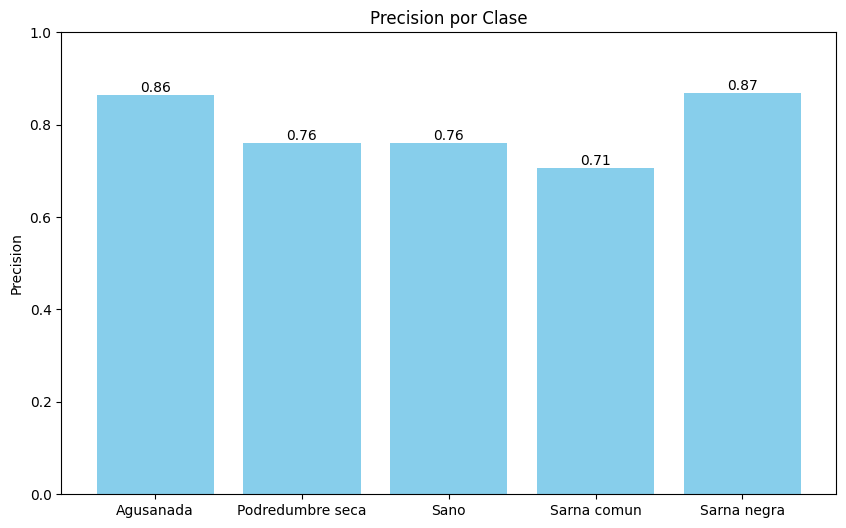

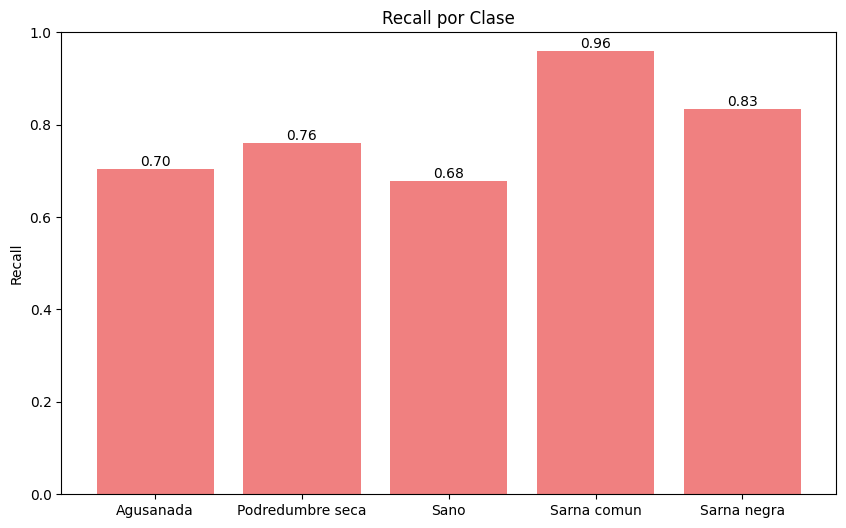

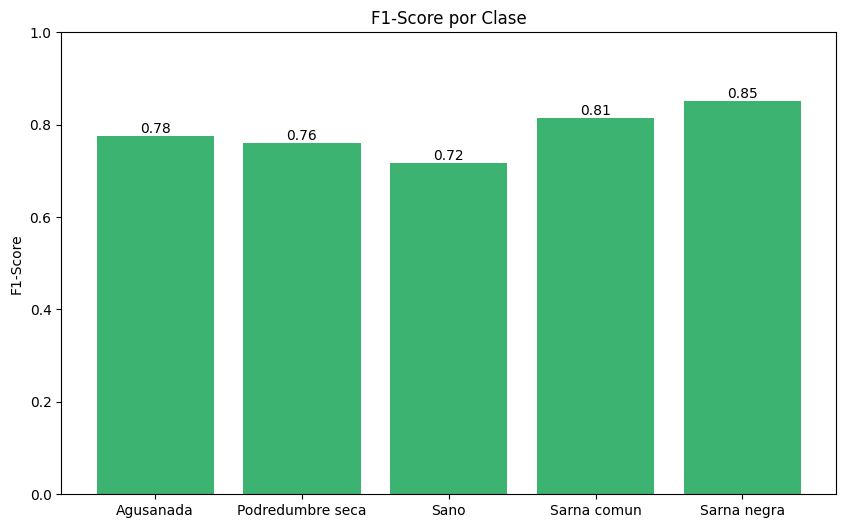

In [20]:
model_configs = [
    {"model_name": "inception_v3", "img_size": 299, "epochs": 30, "batch_size": 16, "learning_rate": 0.001}
]

df_resultados_6 = train_multiple_models(model_configs, train_dir, val_dir, test_dir, num_classes, device)
df_resultados_6